In [1]:
# AeroCNN-II
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

import datetime
%matplotlib inline

In [2]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 100
strides1 = 1
strides2 = 2
lr=5e-04
batch_size=20

In [3]:
alpha = np.linspace(-10,20,16).reshape((16,1))

In [4]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [5]:
aa = aa.reshape((133, 16, 1, 1))

In [6]:
os.chdir('D:\\AeroCNN2Inputs')

In [7]:
origin = "D:\\AeroCNN2Inputs2"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_poisson = "D:\\CNN_poisson_files\\laplace\\bc2"

In [8]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [9]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data])

In [10]:
image_np = image_df.iloc[:, :].values

In [11]:
image = image_np.reshape((133, 16, n_grid, n_grid))

In [12]:
image = 1-image/100

In [13]:
# Laplace/Poisson field
field_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin_poisson + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        field_df = pd.concat([field_df, data], axis=0)

In [14]:
field_np = field_df.iloc[:, :].values

In [15]:
imr = SimpleImputer(missing_values=np.nan, strategy='mean')
imr = imr.fit(field_np)
imputed_field = imr.transform(field_np)

In [16]:
field = imputed_field.reshape((133, 16, n_grid, n_grid))

In [17]:
field_nor = (field-np.min(field))/(np.max(field)-np.min(field))

In [18]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 1].values

In [19]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [20]:
geometry = geometry.reshape((133, 16, 1))

In [21]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(image, aa, geometry, field_nor, test_size=0.1, random_state=1)

In [22]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(x_all, aa_all, geo_all, y_all, test_size=0.2, random_state=1)

In [23]:
x_train = x_train.reshape((x_train.shape[0]*x_train.shape[1], x_train.shape[2], x_train.shape[3], 1))
x_val = x_val.reshape((x_val.shape[0]*x_val.shape[1], x_val.shape[2], x_val.shape[3], 1))
x_test = x_test.reshape((x_test.shape[0]*x_test.shape[1], x_test.shape[2], x_test.shape[3], 1))
aa_train = aa_train.reshape((aa_train.shape[0]*aa_train.shape[1], aa_train.shape[2], aa_train.shape[3]))
aa_val = aa_val.reshape((aa_val.shape[0]*aa_val.shape[1], aa_val.shape[2], aa_val.shape[3]))
aa_test = aa_test.reshape((aa_test.shape[0]*aa_test.shape[1], aa_test.shape[2], aa_test.shape[3]))
geo_train = geo_train.reshape((geo_train.shape[0]*geo_train.shape[1], geo_train.shape[2]))
geo_val = geo_val.reshape((geo_val.shape[0]*geo_val.shape[1], geo_val.shape[2]))
geo_test = geo_test.reshape((geo_test.shape[0]*geo_test.shape[1], geo_test.shape[2]))
y_train = y_train.reshape((y_train.shape[0]*y_train.shape[1], y_train.shape[2], y_train.shape[3], 1))
y_val = y_val.reshape((y_val.shape[0]*y_val.shape[1], y_val.shape[2], y_val.shape[3], 1))
y_test = y_test.reshape((y_test.shape[0]*y_test.shape[1], y_test.shape[2], y_test.shape[3], 1))

In [24]:
tf.keras.backend.set_image_data_format('channels_last')

In [25]:
input_image = tf.keras.Input(shape=(n_grid, n_grid, 1))

x_conv1 = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer1')(input_image)
x_1 = tf.keras.layers.MaxPooling2D((2,2))(x_conv1)
x_conv2 = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size2, kernel_size2), strides=(strides1, strides1),
                                 activation='relu', padding='same',
                                 kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                 name='Conv2DLayer2')(x_1)
x_2 = tf.keras.layers.MaxPooling2D((2,2))(x_conv2)

x_deconv1 = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size2, kernel_size2),
                                            strides=(strides2,strides2),
                                            activation='relu', padding='same',
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            name='Conv2DTLayer1')(x_2)
x_deconv2 = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                            strides=(strides2,strides2),
                                            activation='relu', padding='same',
                                            kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                            name='Conv2DTLayer2')(x_deconv1)

x_conv_final = tf.keras.layers.Conv2D(1, (kernel_size1, kernel_size1), strides=(strides1, strides1),
                                      activation='relu', padding='valid',
                                      kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                      name='Conv2DLayerFinal')(x_deconv2)
x_flat = tf.keras.layers.Flatten()(x_conv_final)
x_ = tf.keras.layers.Dense(units=int((n_grid)**2), activation='linear', name='FCLayer',
                           kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_flat)

output_data = tf.keras.layers.Reshape((n_grid,n_grid,1))(x_)

# AeroCNN-II/Poisson/BC 2
model = tf.keras.Model(input_image, output_data)

In [26]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 50, 50, 100)      0         
 )                                                               
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 Conv2DTLayer1 (Conv2DTransp  (None, 50, 50, 200)      360200

In [27]:
#with mirrored_strategy.scope():
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [28]:
#with mirrored_strategy.scope():
# 끝까지 학습시키고 싶을 땐 ReduceLRONPlateau에서 min_delta를 1e-11로, patience=100,
# EarlyStopping에서 patience를 200으로 설정. 평상시에는(50. 100, 1e-7로.)
# 아예 loss가 1e-6되면 멈추게끔 할 수도?
start = datetime.datetime.now()
history = model.fit(x_train, y_train, epochs=5000, shuffle=True, 
                    validation_data=[x_val, y_val], batch_size=batch_size,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100,
                                                                min_delta=6e-7,
                                                                restore_best_weights=True,
                                                                verbose=1),
                               tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.5,
                                                                    mode='min', patience=50,
                                                                    min_delta=1e-7,
                                                                    min_lr=1e-06,
                                                                    verbose=1)])
end = datetime.datetime.now()

Epoch 1/5000
76/76 [==============================] - 9s 48ms/step - loss: 0.0339 - rmse: 0.1840 - val_loss: 1.5087e-04 - val_rmse: 0.0119 - lr: 5.0000e-04
Epoch 2/5000
76/76 [==============================] - 3s 35ms/step - loss: 1.4714e-04 - rmse: 0.0117 - val_loss: 1.4118e-04 - val_rmse: 0.0114 - lr: 5.0000e-04
Epoch 3/5000
76/76 [==============================] - 3s 35ms/step - loss: 1.4252e-04 - rmse: 0.0115 - val_loss: 1.2996e-04 - val_rmse: 0.0109 - lr: 5.0000e-04
Epoch 4/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.4242e-04 - rmse: 0.0115 - val_loss: 1.3635e-04 - val_rmse: 0.0112 - lr: 5.0000e-04
Epoch 5/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.4268e-04 - rmse: 0.0115 - val_loss: 1.2574e-04 - val_rmse: 0.0107 - lr: 5.0000e-04
Epoch 6/5000
76/76 [==============================] - 3s 34ms/step - loss: 1.3531e-04 - rmse: 0.0112 - val_loss: 1.1786e-04 - val_rmse: 0.0104 - lr: 5.0000e-04
Epoch 7/5000
76/76 [========================

Epoch 52/5000
76/76 [==============================] - 2s 32ms/step - loss: 4.4393e-05 - rmse: 0.0059 - val_loss: 3.9887e-05 - val_rmse: 0.0055 - lr: 5.0000e-04
Epoch 53/5000
76/76 [==============================] - 2s 32ms/step - loss: 5.3228e-05 - rmse: 0.0066 - val_loss: 2.0954e-05 - val_rmse: 0.0033 - lr: 5.0000e-04
Epoch 54/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.0059e-04 - rmse: 0.0095 - val_loss: 1.9103e-05 - val_rmse: 0.0030 - lr: 5.0000e-04
Epoch 55/5000
76/76 [==============================] - 2s 32ms/step - loss: 3.7119e-05 - rmse: 0.0052 - val_loss: 1.4959e-05 - val_rmse: 0.0022 - lr: 5.0000e-04
Epoch 56/5000
76/76 [==============================] - 2s 32ms/step - loss: 2.1640e-05 - rmse: 0.0034 - val_loss: 1.9918e-05 - val_rmse: 0.0032 - lr: 5.0000e-04
Epoch 57/5000
76/76 [==============================] - 2s 32ms/step - loss: 2.0141e-05 - rmse: 0.0032 - val_loss: 1.5045e-05 - val_rmse: 0.0023 - lr: 5.0000e-04
Epoch 58/5000
76/76 [=============

Epoch 102/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.3880e-05 - rmse: 0.0021 - val_loss: 1.1506e-05 - val_rmse: 0.0014 - lr: 2.5000e-04
Epoch 103/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.3689e-05 - rmse: 0.0020 - val_loss: 1.9445e-05 - val_rmse: 0.0031 - lr: 2.5000e-04
Epoch 104/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.4264e-05 - rmse: 0.0022 - val_loss: 1.2179e-05 - val_rmse: 0.0016 - lr: 2.5000e-04
Epoch 105/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.8474e-05 - rmse: 0.0030 - val_loss: 3.0968e-05 - val_rmse: 0.0046 - lr: 2.5000e-04
Epoch 106/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.6912e-05 - rmse: 0.0027 - val_loss: 1.0863e-05 - val_rmse: 0.0011 - lr: 2.5000e-04
Epoch 107/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.4555e-05 - rmse: 0.0022 - val_loss: 1.2936e-05 - val_rmse: 0.0018 - lr: 2.5000e-04
Epoch 108/5000
76/76 [======

76/76 [==============================] - 2s 33ms/step - loss: 1.1204e-05 - rmse: 0.0013 - val_loss: 1.2031e-05 - val_rmse: 0.0016 - lr: 1.2500e-04
Epoch 152/5000
76/76 [==============================] - 2s 33ms/step - loss: 1.2107e-05 - rmse: 0.0017 - val_loss: 1.1042e-05 - val_rmse: 0.0013 - lr: 1.2500e-04
Epoch 153/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.1880e-05 - rmse: 0.0016 - val_loss: 1.3181e-05 - val_rmse: 0.0020 - lr: 1.2500e-04
Epoch 154/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.1335e-05 - rmse: 0.0014 - val_loss: 1.0397e-05 - val_rmse: 0.0010 - lr: 1.2500e-04
Epoch 155/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.1526e-05 - rmse: 0.0015 - val_loss: 1.0422e-05 - val_rmse: 0.0010 - lr: 1.2500e-04
Epoch 156/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.2076e-05 - rmse: 0.0016 - val_loss: 1.0611e-05 - val_rmse: 0.0011 - lr: 1.2500e-04
Epoch 157/5000
76/76 [=====================

76/76 [==============================] - 2s 32ms/step - loss: 1.0680e-05 - rmse: 0.0012 - val_loss: 1.0316e-05 - val_rmse: 0.0010 - lr: 6.2500e-05
Epoch 201/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.0381e-05 - rmse: 0.0011 - val_loss: 1.1091e-05 - val_rmse: 0.0014 - lr: 6.2500e-05
Epoch 202/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.0544e-05 - rmse: 0.0011 - val_loss: 1.0581e-05 - val_rmse: 0.0012 - lr: 6.2500e-05
Epoch 203/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.0543e-05 - rmse: 0.0011 - val_loss: 1.0267e-05 - val_rmse: 0.0010 - lr: 6.2500e-05
Epoch 204/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.0321e-05 - rmse: 0.0010 - val_loss: 1.0201e-05 - val_rmse: 9.7606e-04 - lr: 6.2500e-05
Epoch 205/5000
76/76 [==============================] - 2s 32ms/step - loss: 1.0536e-05 - rmse: 0.0011 - val_loss: 1.0560e-05 - val_rmse: 0.0011 - lr: 6.2500e-05
Epoch 206/5000
76/76 [=================

In [29]:
time = end - start
print("Training time:", time)

Training time: 0:09:35.828460


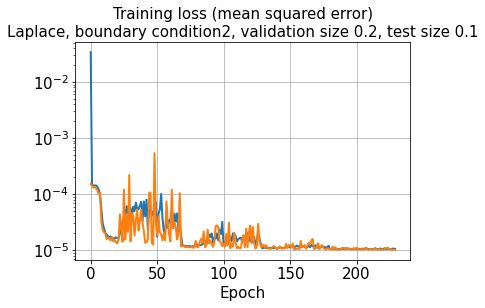

In [30]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.plot(hist['val_loss'],lw=2)
plt.title('Training loss (mean squared error)\nLaplace, boundary condition2, validation size 0.2, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

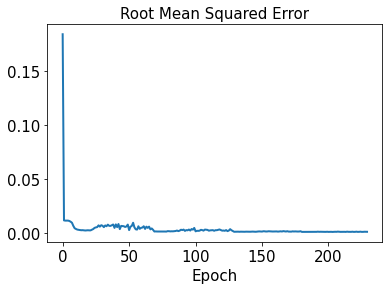

In [31]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

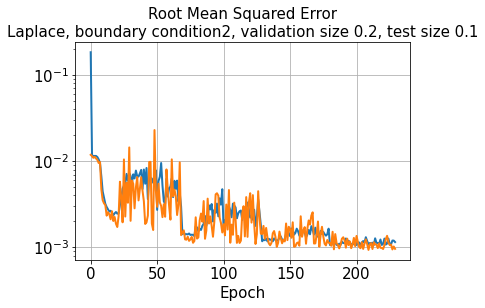

In [32]:
plt.plot(hist['rmse'], lw=2)
plt.plot(hist['val_rmse'], lw=2)
plt.title('Root Mean Squared Error\nLaplace, boundary condition2, validation size 0.2, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

In [33]:
#with mirrored_strategy.scope():
test_results = model.evaluate(x_train)

48/48 [==============================] - 0s 3ms/step - loss: 9.4480e-06 - rmse: 0.0000e+00


In [34]:
#with mirrored_strategy.scope():
decoded_train = model.predict(x_train)

48/48 [==============================] - 1s 12ms/step


In [35]:
decoded_val = model.predict(x_val)

12/12 [==============================] - 0s 10ms/step


In [36]:
#with mirrored_strategy.scope():
decoded_test = model.predict(x_test)

7/7 [==============================] - 0s 10ms/step


In [37]:
error_train_abs = np.abs(decoded_train - y_train)

In [38]:
error_val_abs = np.abs(decoded_val - y_val)

In [39]:
error_test_abs = np.abs(decoded_test - y_test)

In [40]:
os.chdir("D:\\TrainedModels\\20221030")
model.save('Laplace_bc2_100kernel_2by2MaxPooling_2CNNlayer_valSize0.2testSize0.1.h5',
           overwrite=True, include_optimizer=True, save_format='h5')

In [41]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0021678327178719157


In [42]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.002223583030683709


In [43]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.0021091266597389772


In [44]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)
#print(l2_error_train_list)

In [45]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)
print(l2_error_val_list)

[0.002010608752513512, 0.001969763763401229, 0.0018753555943120997, 0.0018144777420960752, 0.0017459722034417525, 0.001910507152829401, 0.0016932488851665233, 0.00177533246005431, 0.0015017466937696717, 0.001575516713682507, 0.0015395343871412901, 0.0017007658091663092, 0.002023382536795273, 0.0019090578043482874, 0.0017584124687697142, 0.0017308823809967459, 0.0016618014604016726, 0.002178525213506892, 0.0018349731059091234, 0.0019075036597381602, 0.001885293165975212, 0.0018135365834169297, 0.001869880646715757, 0.0016060713838871629, 0.0017005344447208989, 0.0019300106993834043, 0.0018658525425509103, 0.0018120394910363026, 0.0020189764237496743, 0.0017349900517549905, 0.0015836748152710408, 0.0021989449753108347, 0.0021569680801339893, 0.0020059736189381176, 0.002141367489833293, 0.001973850700150674, 0.002035816129217165, 0.0016926354689935981, 0.0020543782817311704, 0.0018387129137373613, 0.001989522947238459, 0.0021676846645067413, 0.0019743188468143167, 0.002040368447828457, 0.

In [46]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)
#print(l2_error_test_list)

In [47]:
os.chdir("D:\\CNN_poisson_files\\images\\20221030\\LaplaceValSize0.2TestSize0.1")

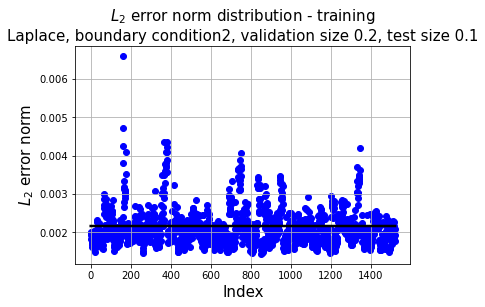

In [48]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm distribution - training\nLaplace, boundary condition2, validation size 0.2, test size 0.1',
          fontsize=15)
plt.grid()
save_variance_name = "20221030L2ErrorDistribution_Poisson_bc2(training).jpg"
plt.savefig(save_variance_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

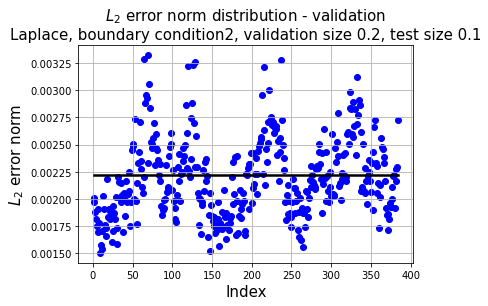

In [49]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_val*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm distribution - validation\nLaplace, boundary condition2, validation size 0.2, test size 0.1',
          fontsize=15)
plt.grid()
save_variance_name = "20221030L2ErrorDistribution_Poisson_bc2(validation).jpg"
plt.savefig(save_variance_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

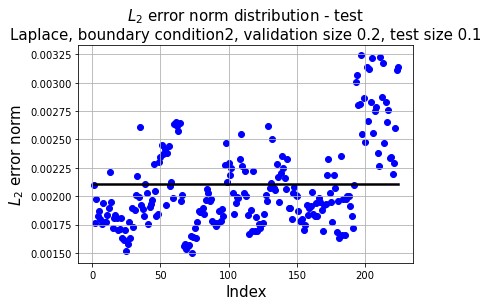

In [50]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm distribution - test\nLaplace, boundary condition2, validation size 0.2, test size 0.1',
          fontsize=15)
plt.grid()
save_test_name = "20221030L2ErrorDistribution_Poisson_bc2(test).jpg"
plt.savefig(save_test_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

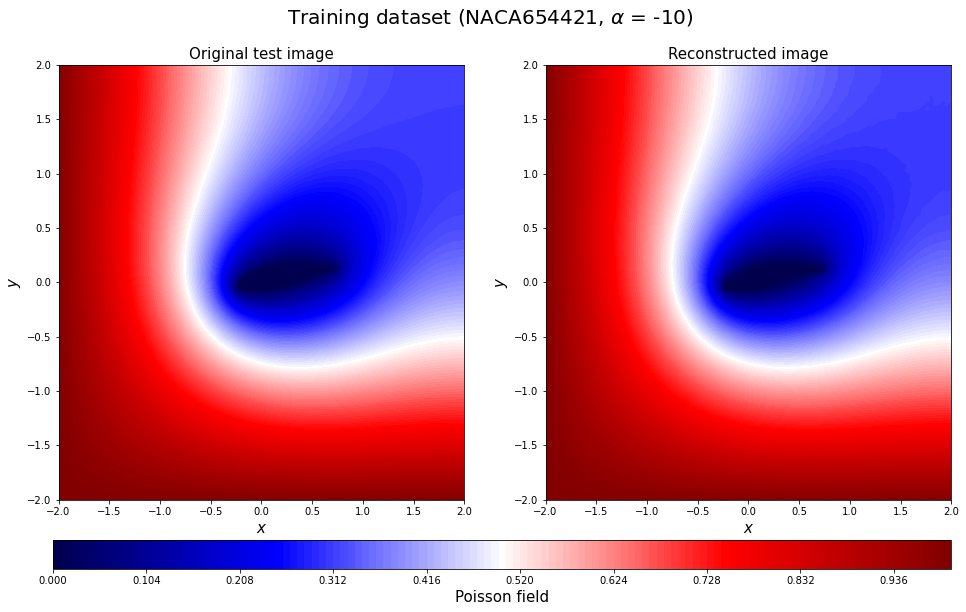

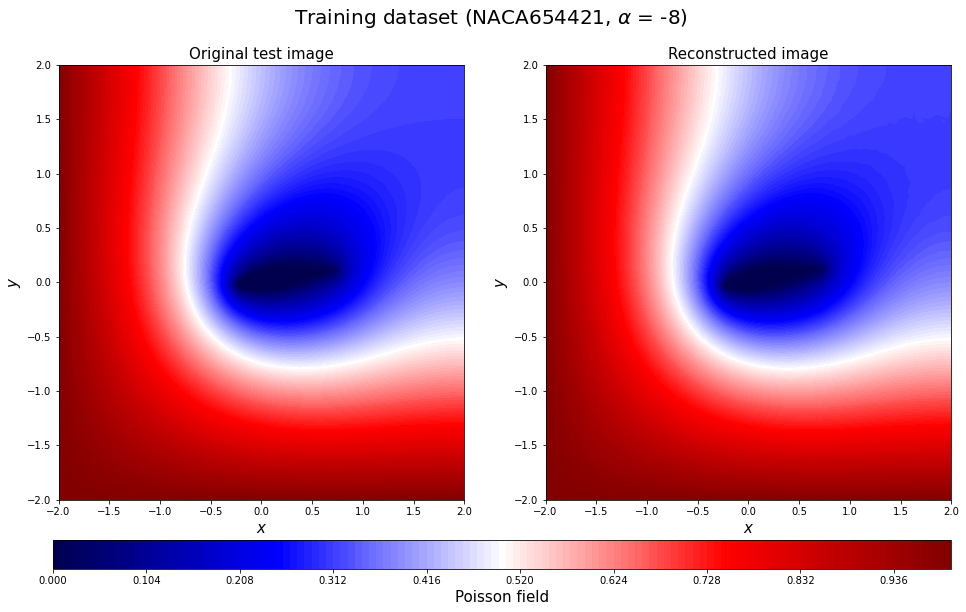

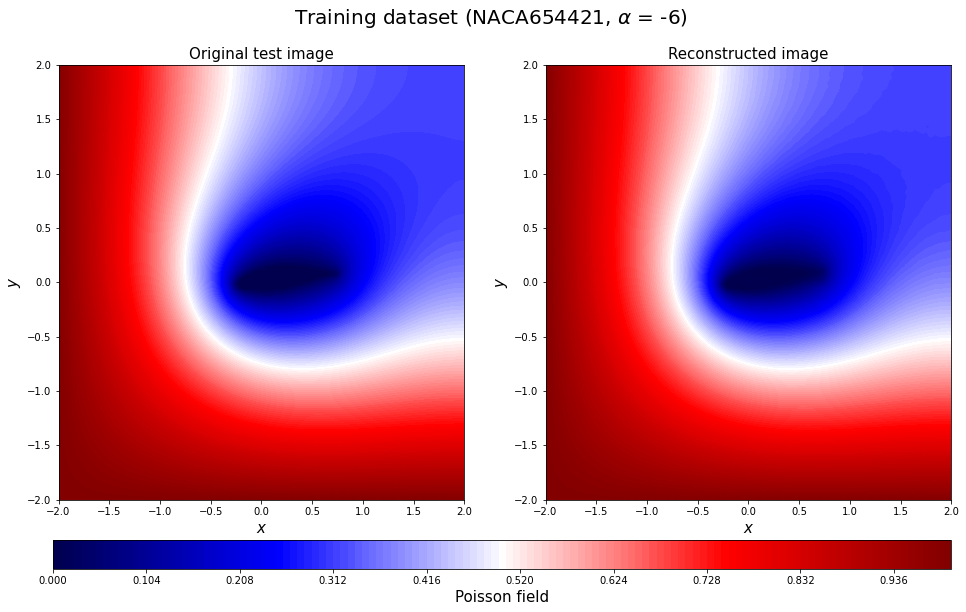

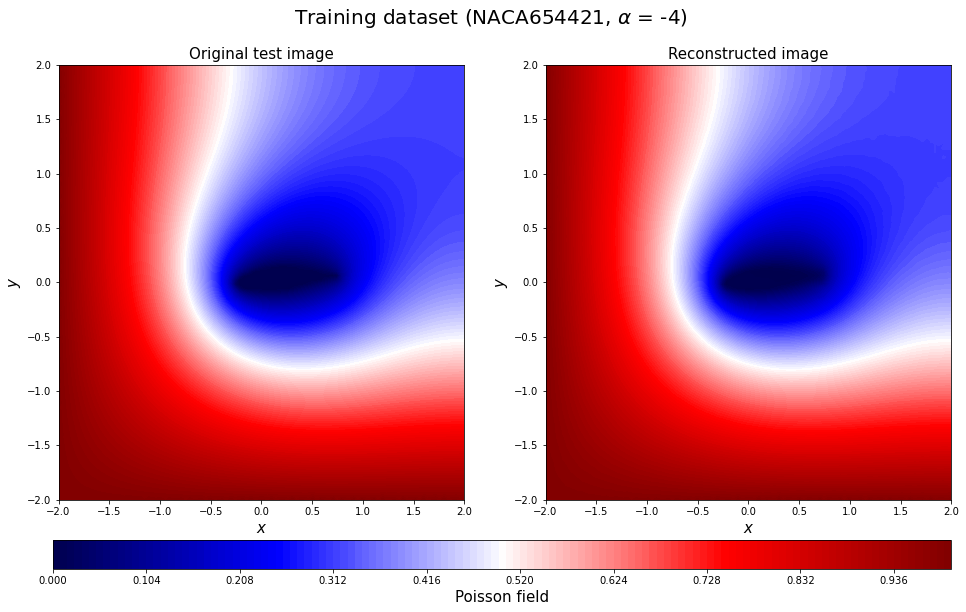

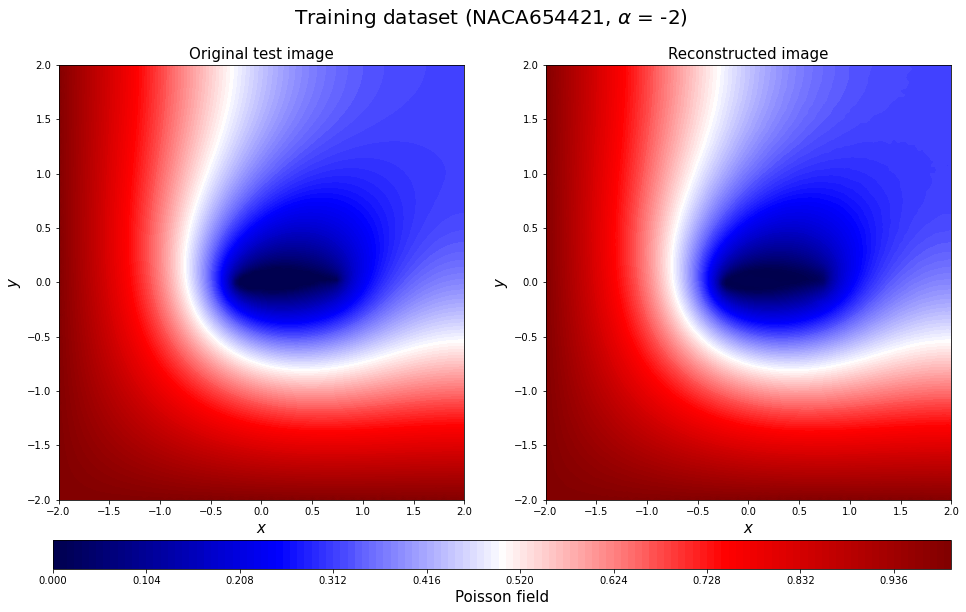

...

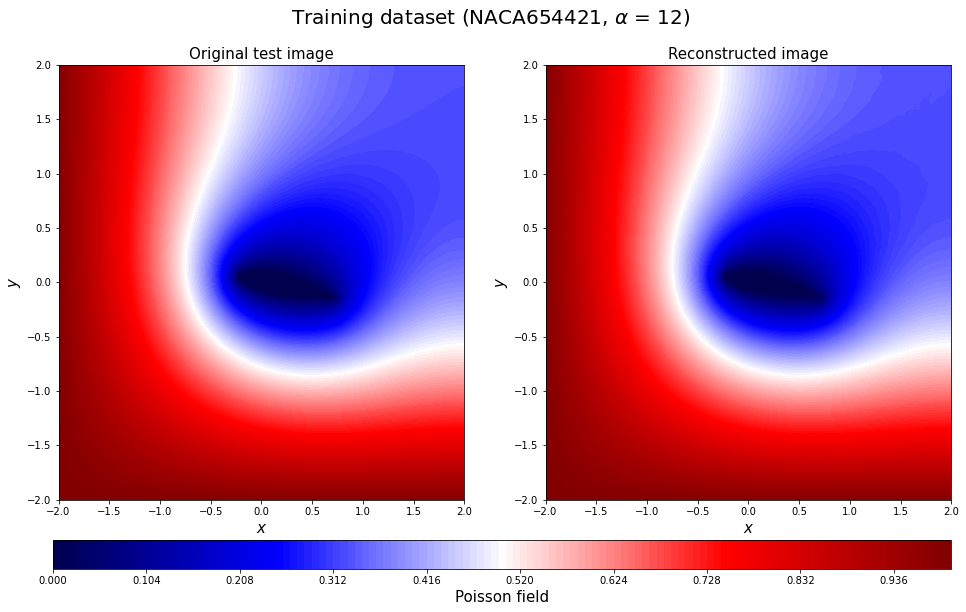

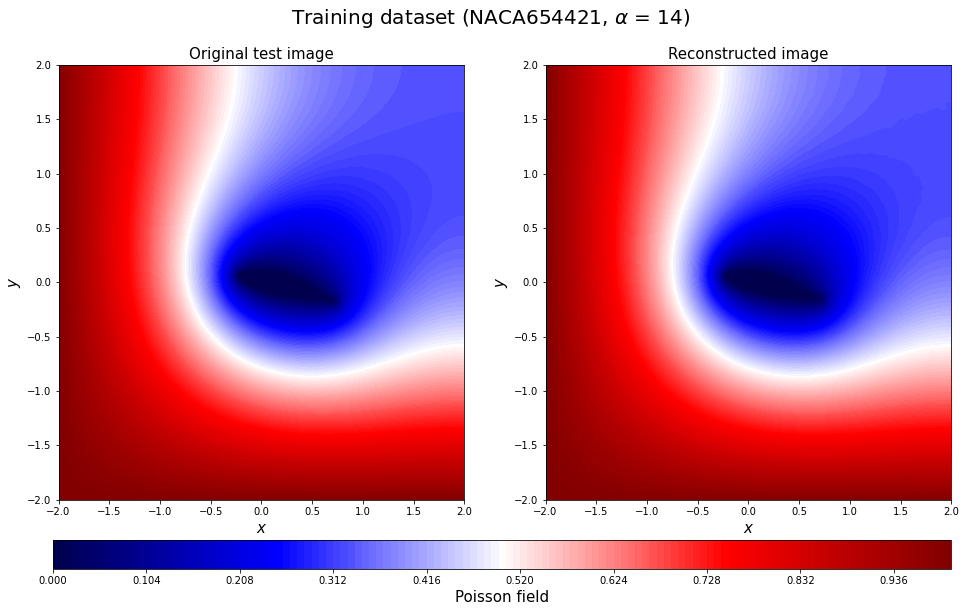

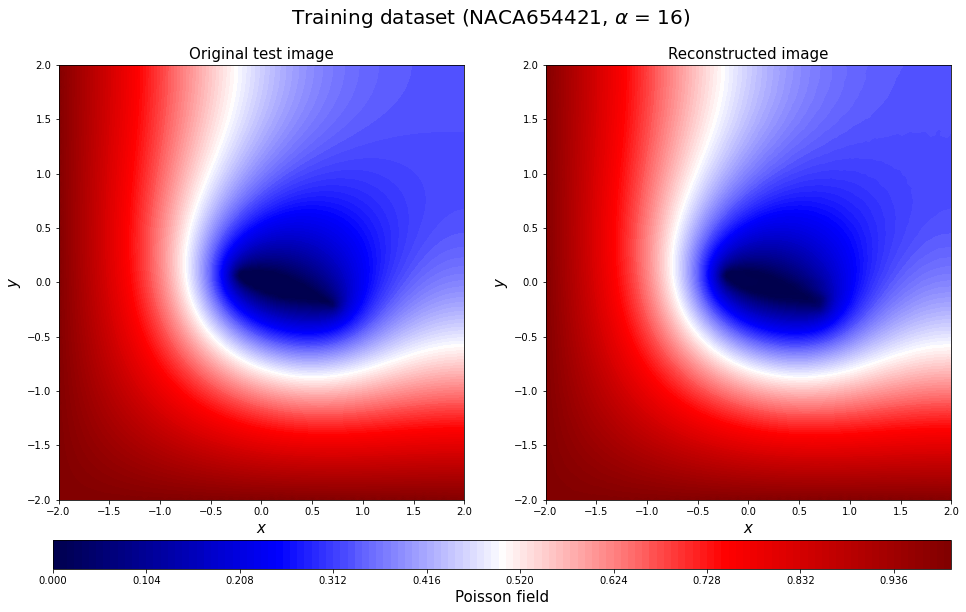

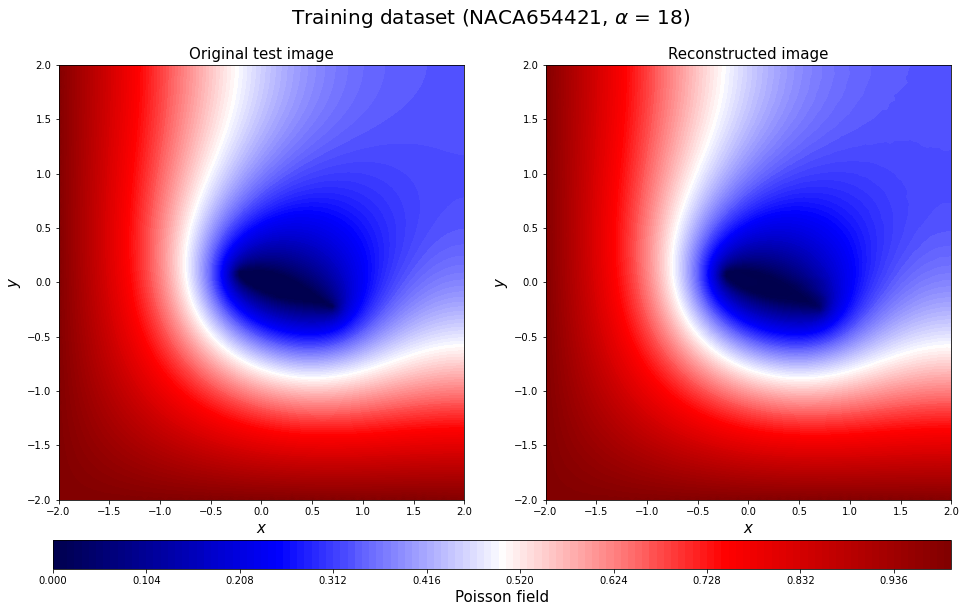

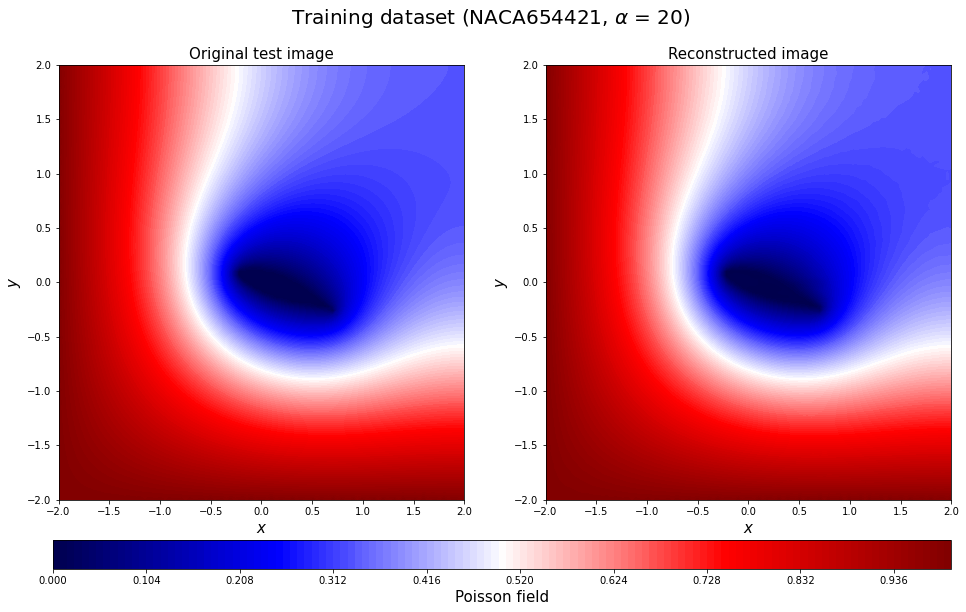

In [51]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate, vmin=np.min(y_train0_rotate),
                      vmax = np.max(y_train0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_train0_rotate),
                      vmax = np.max(y_train0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221030Prediction_Laplace_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

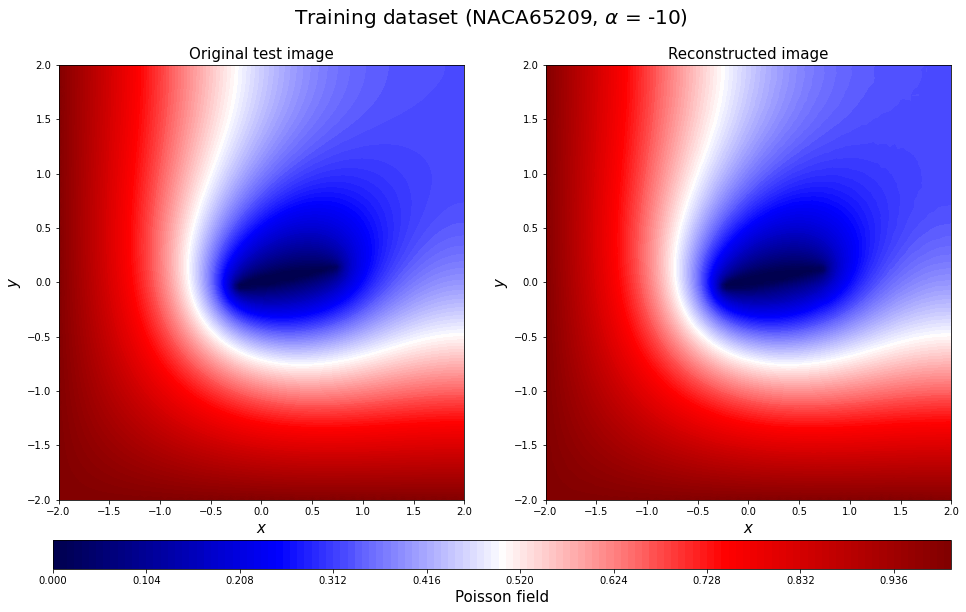

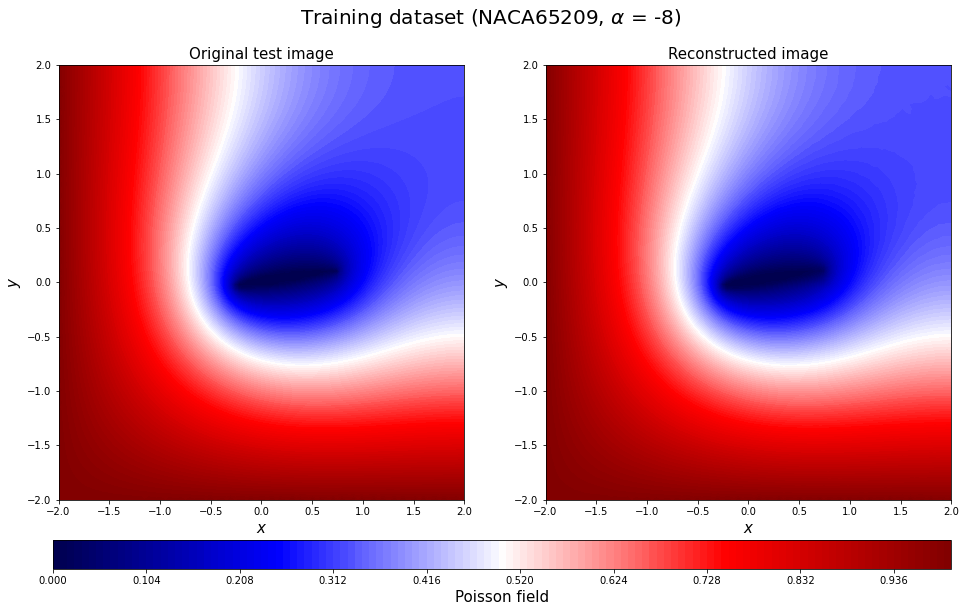

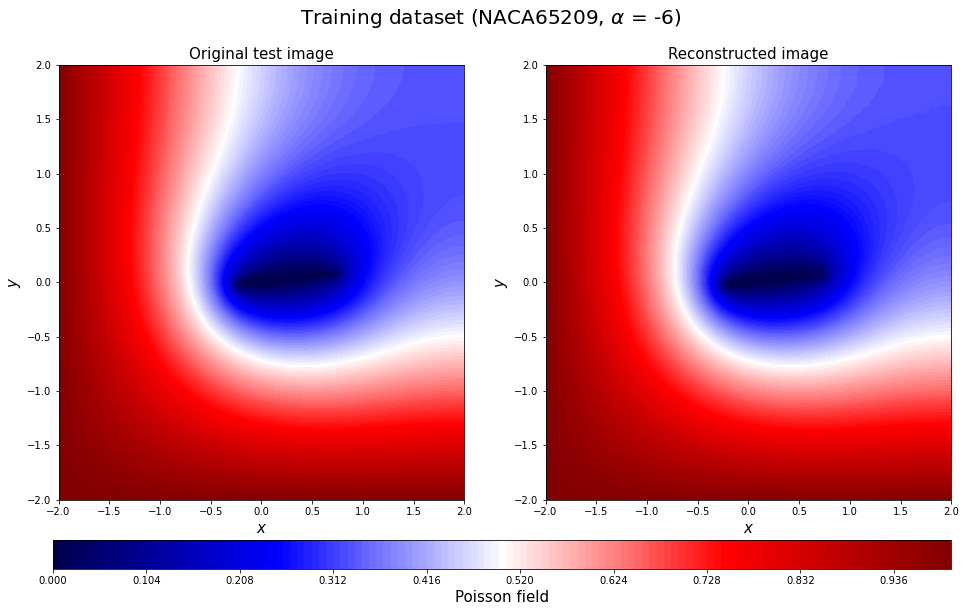

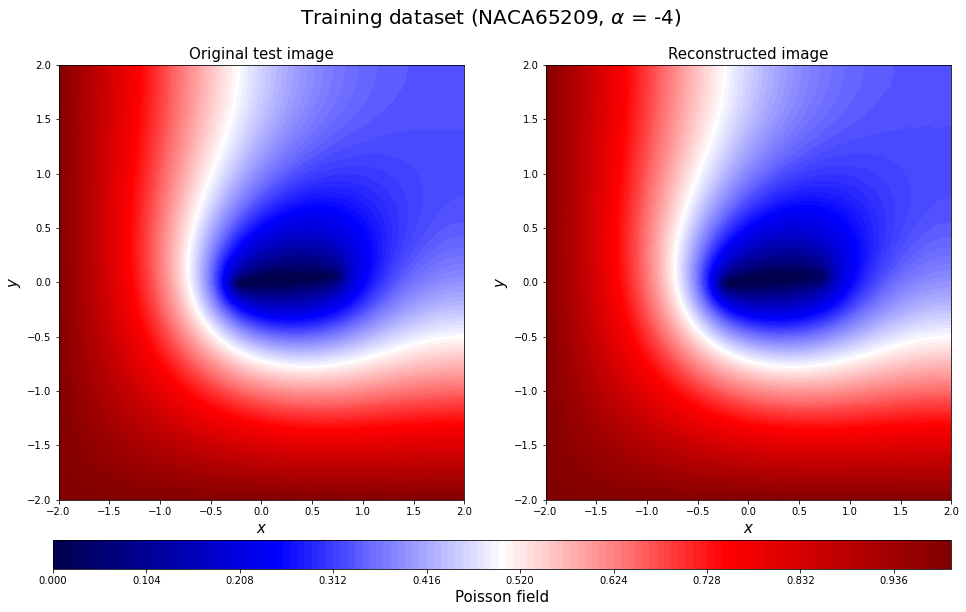

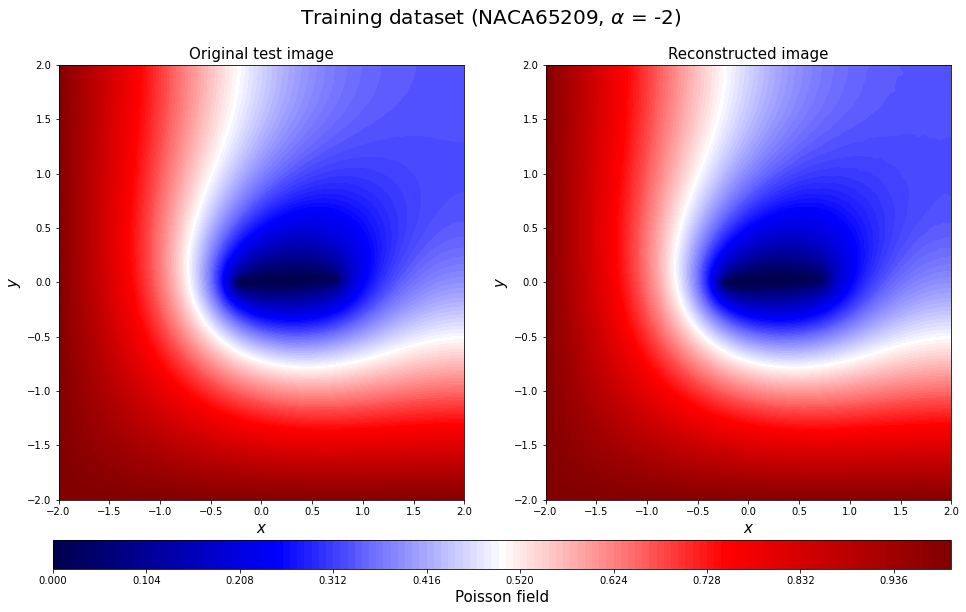

...

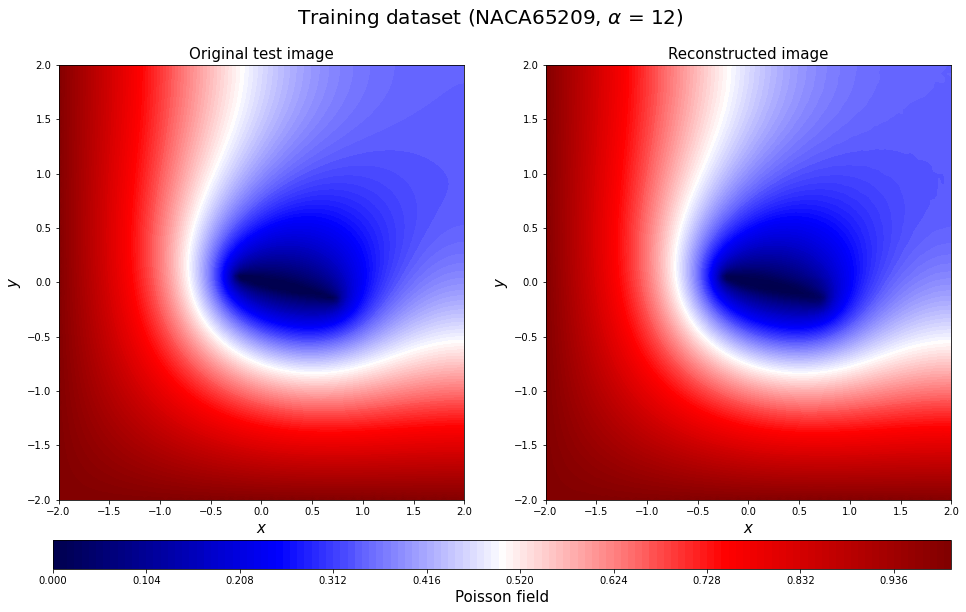

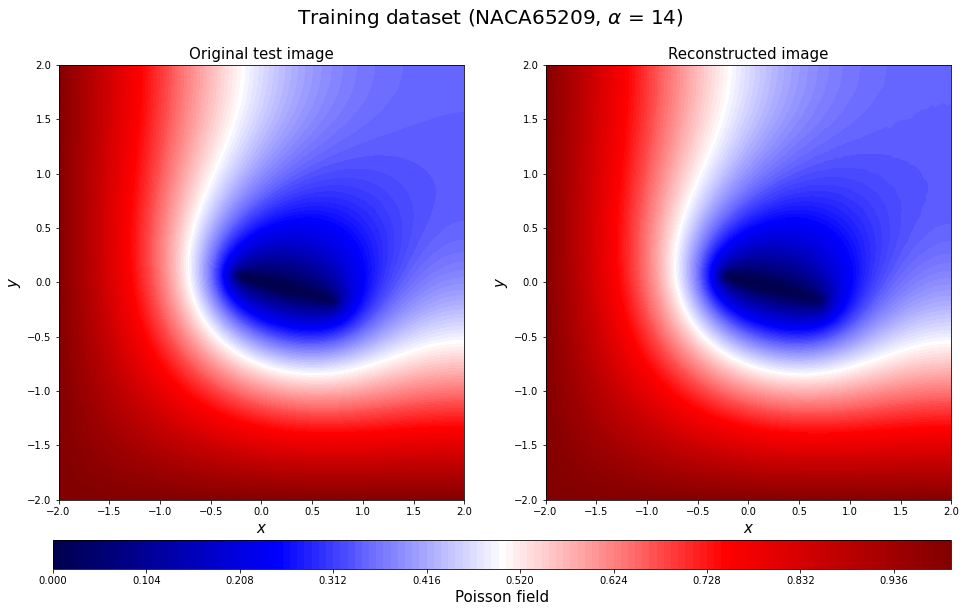

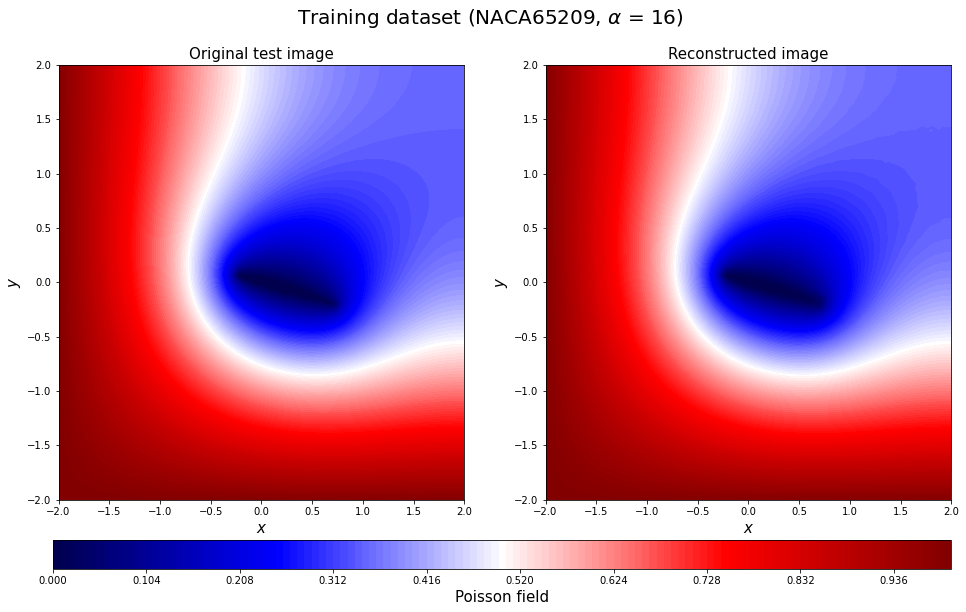

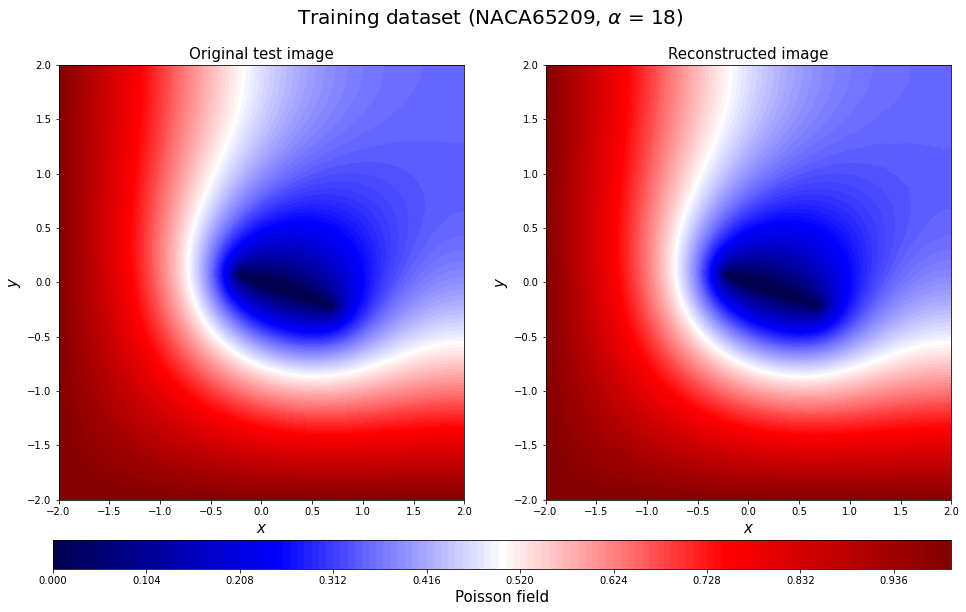

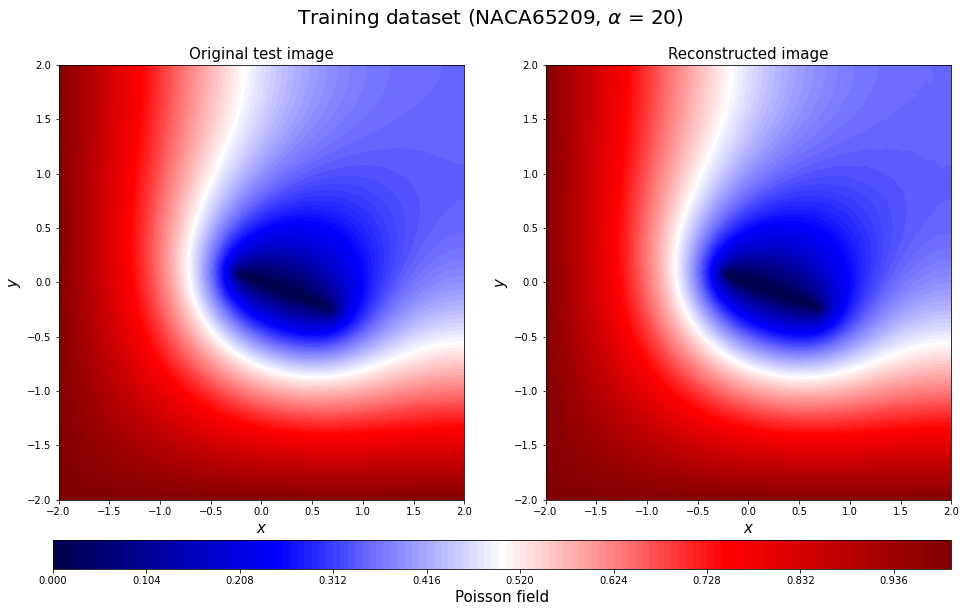

In [52]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, vmin=np.min(y_train20_rotate),
                      vmax=np.max(y_train20_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_train20_rotate),
                      vmax=np.max(y_train20_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

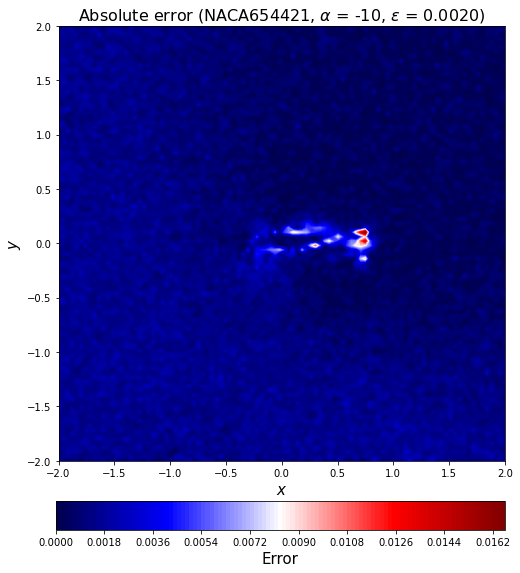

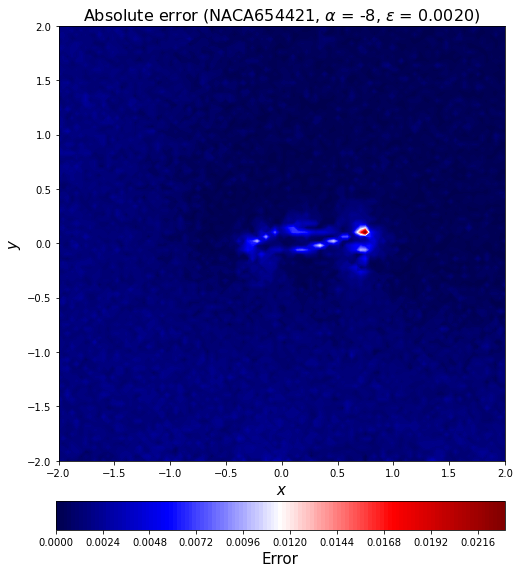

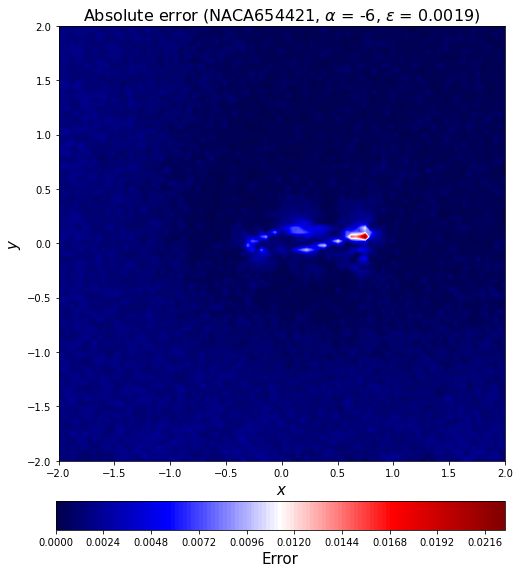

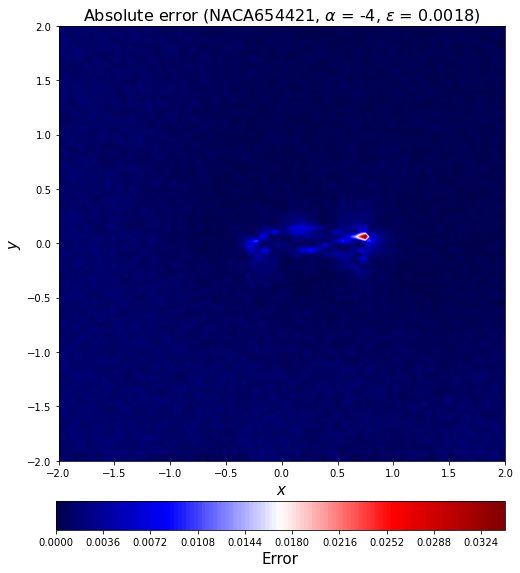

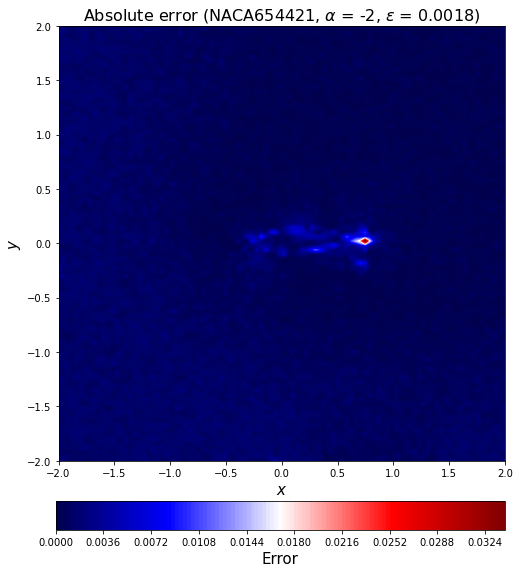

...

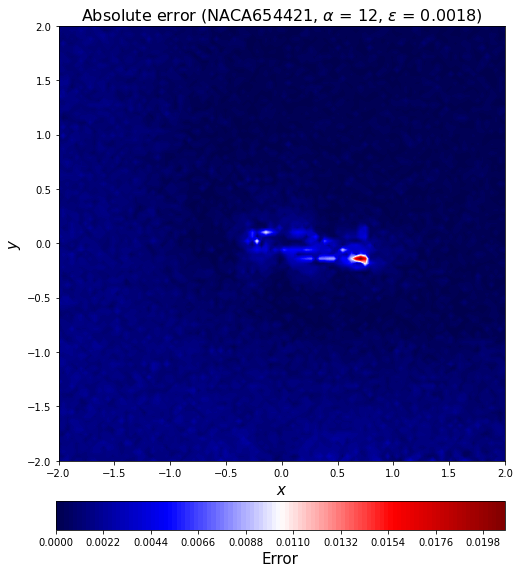

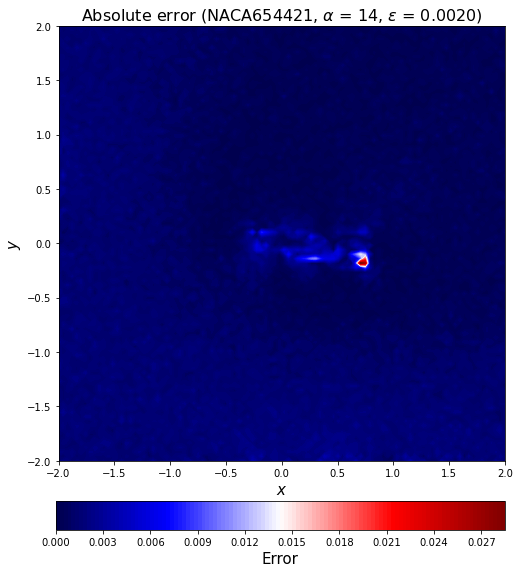

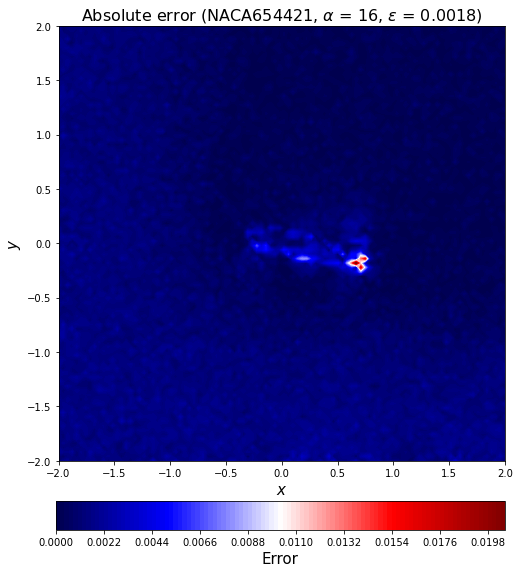

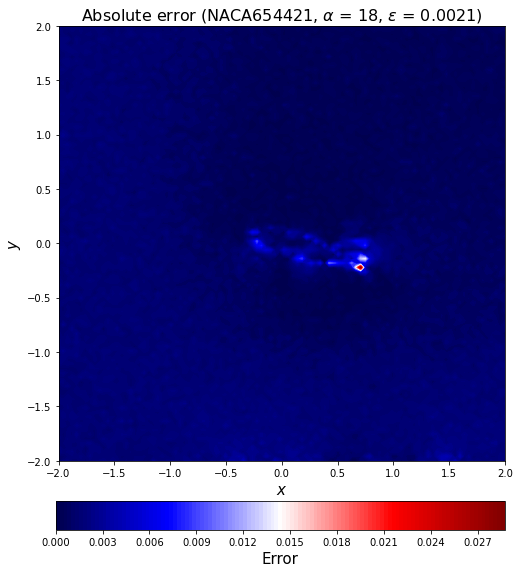

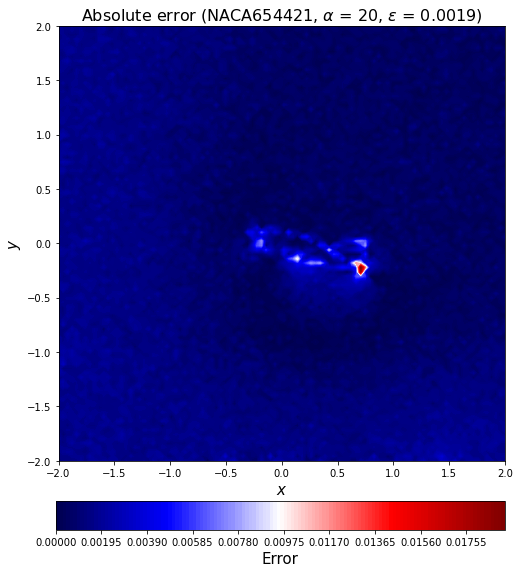

In [53]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])[3:-2]+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

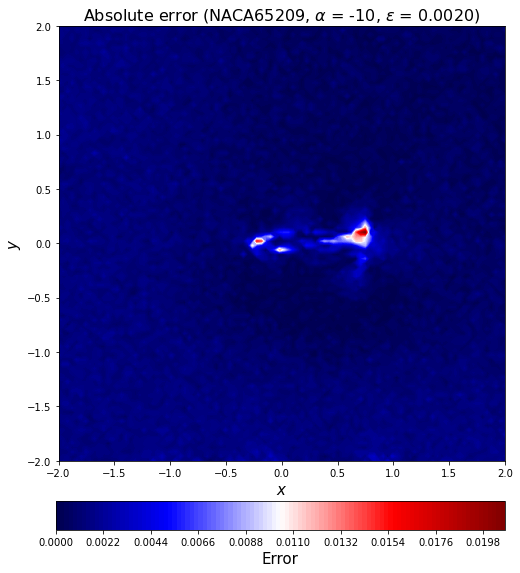

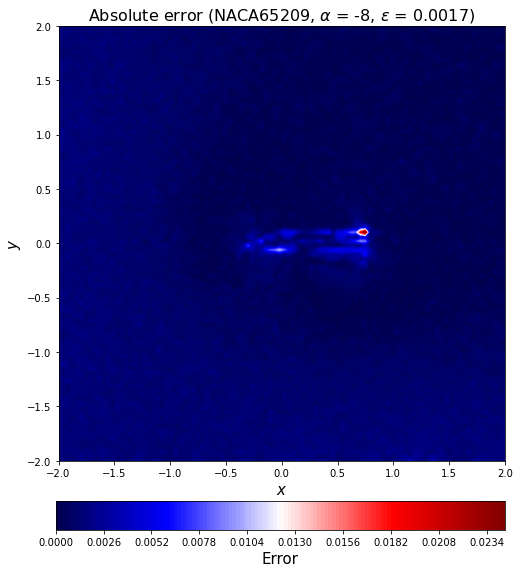

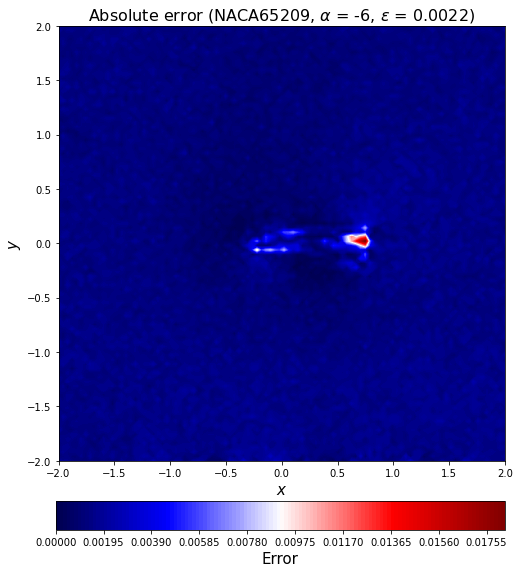

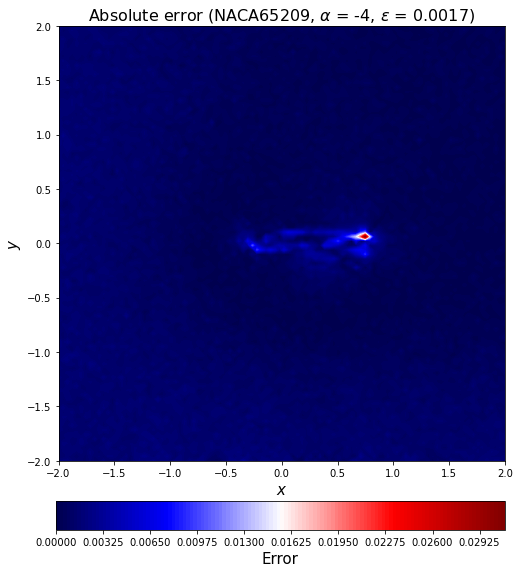

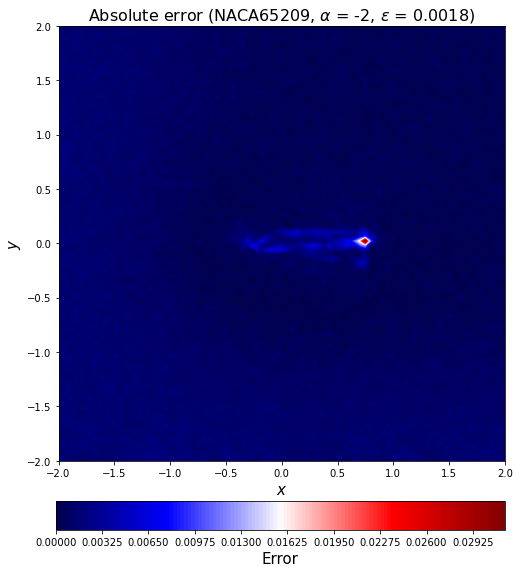

...

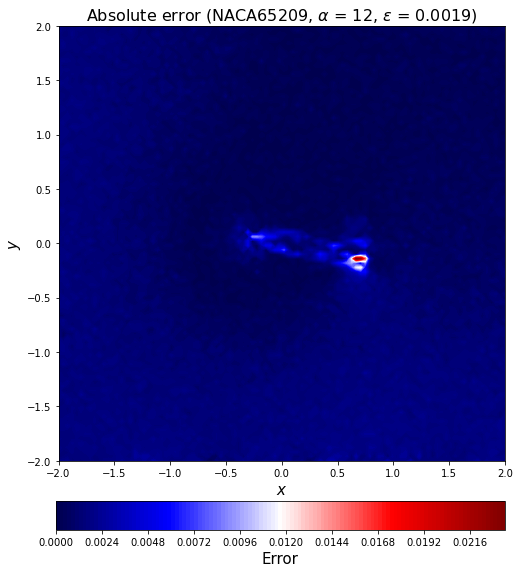

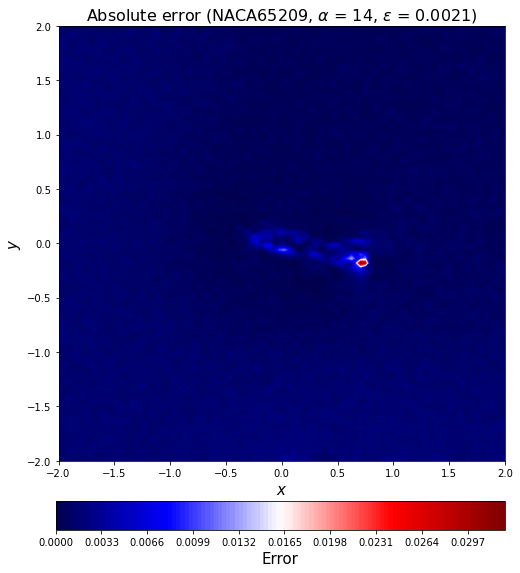

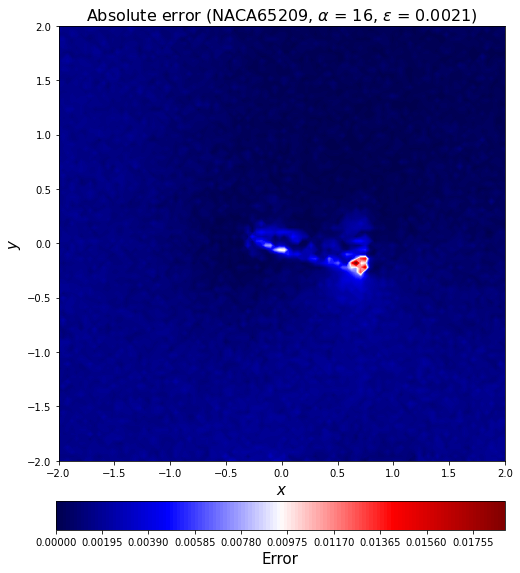

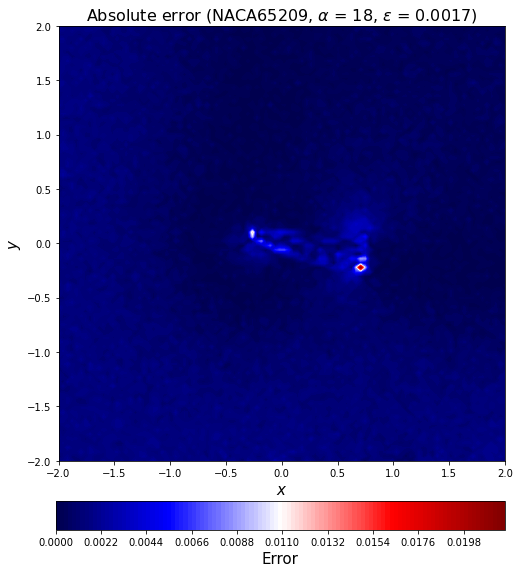

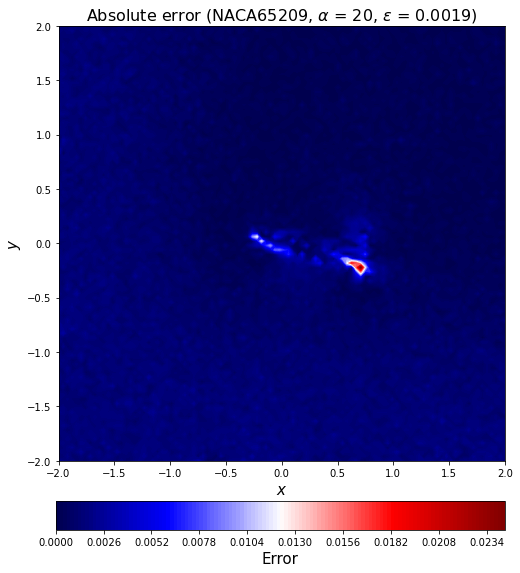

In [54]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[16*20+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

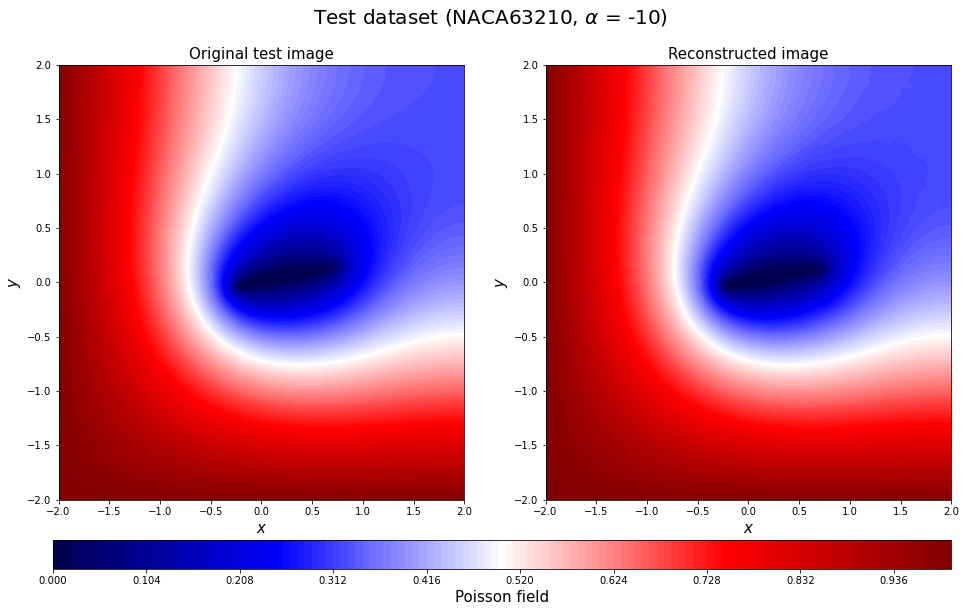

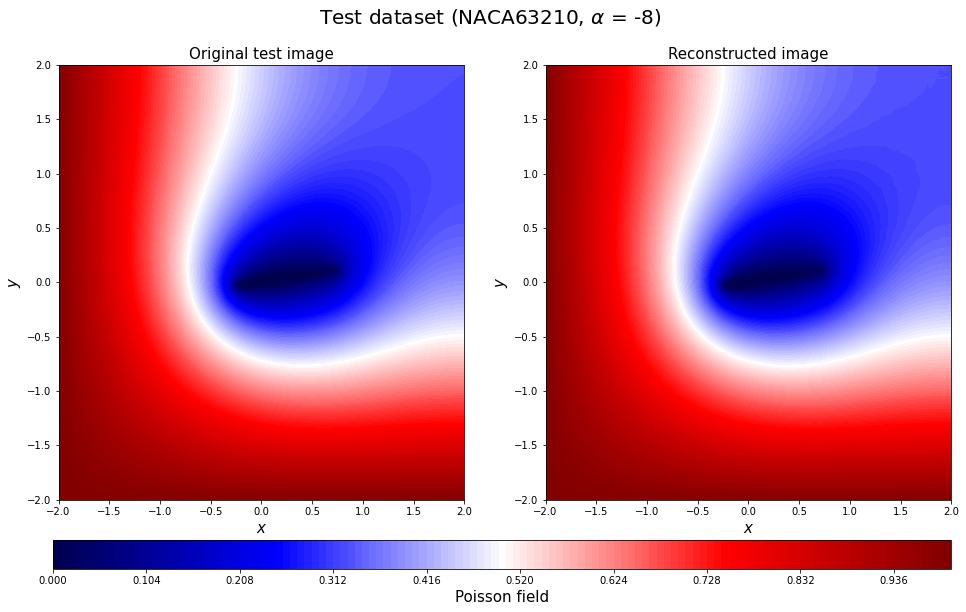

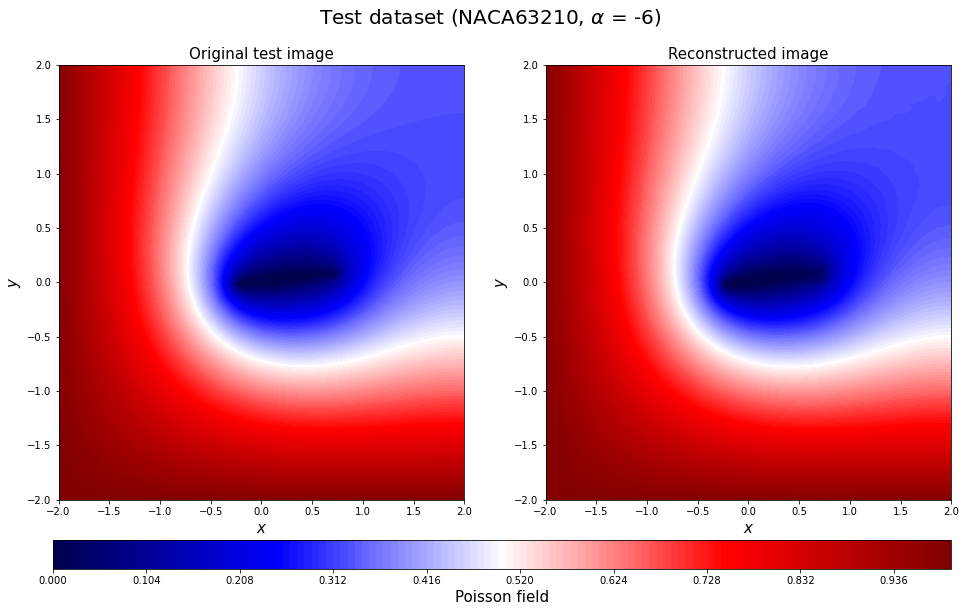

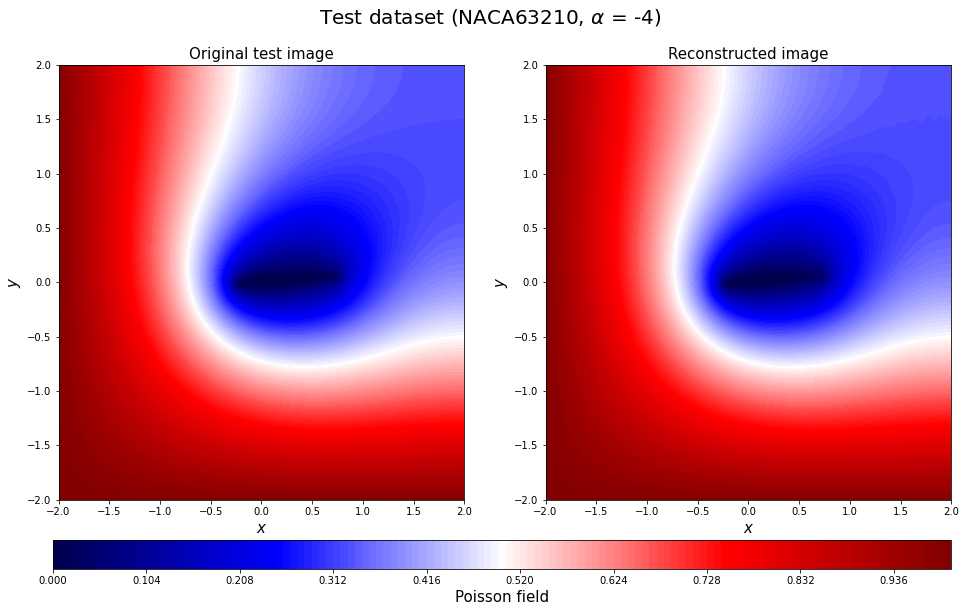

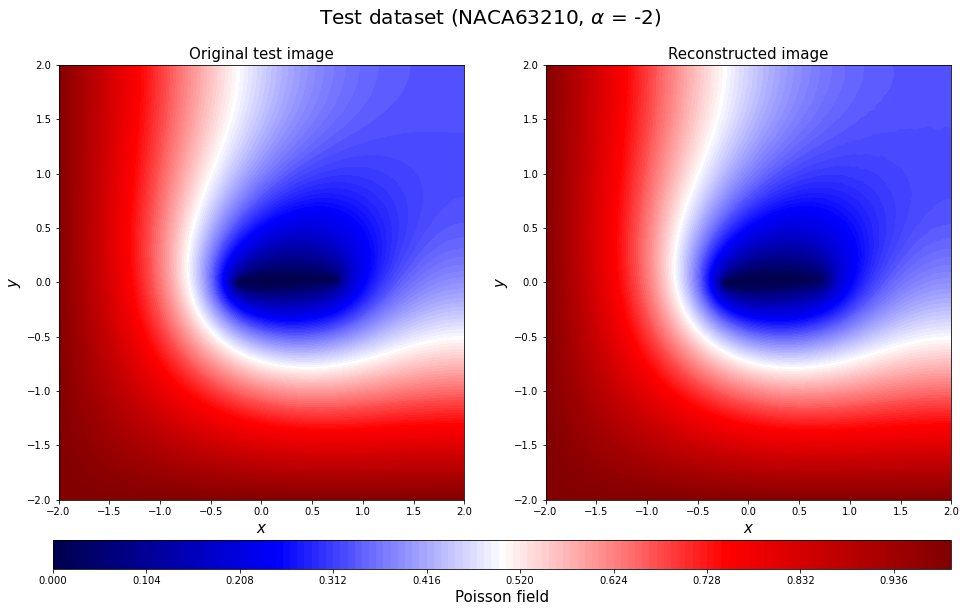

...

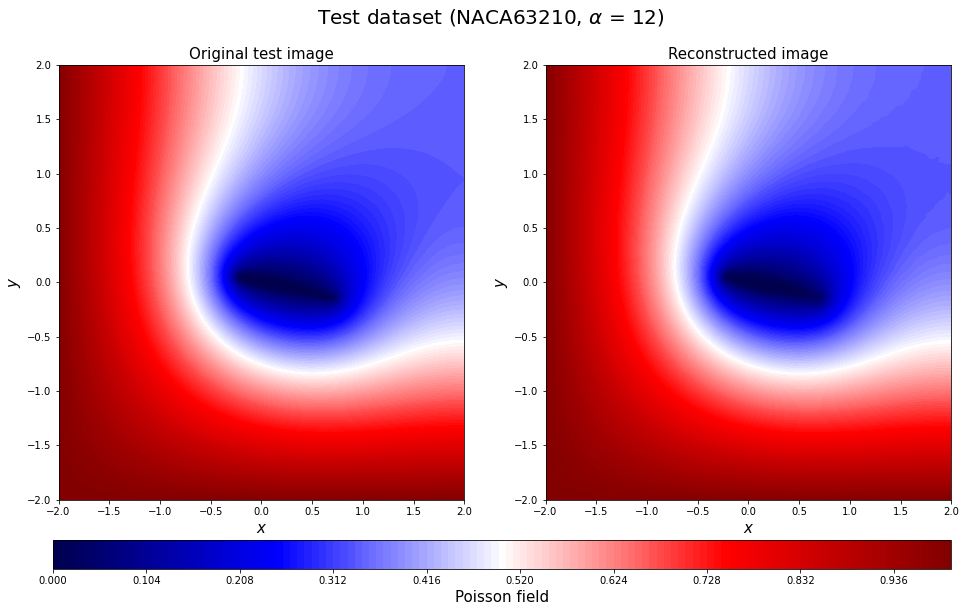

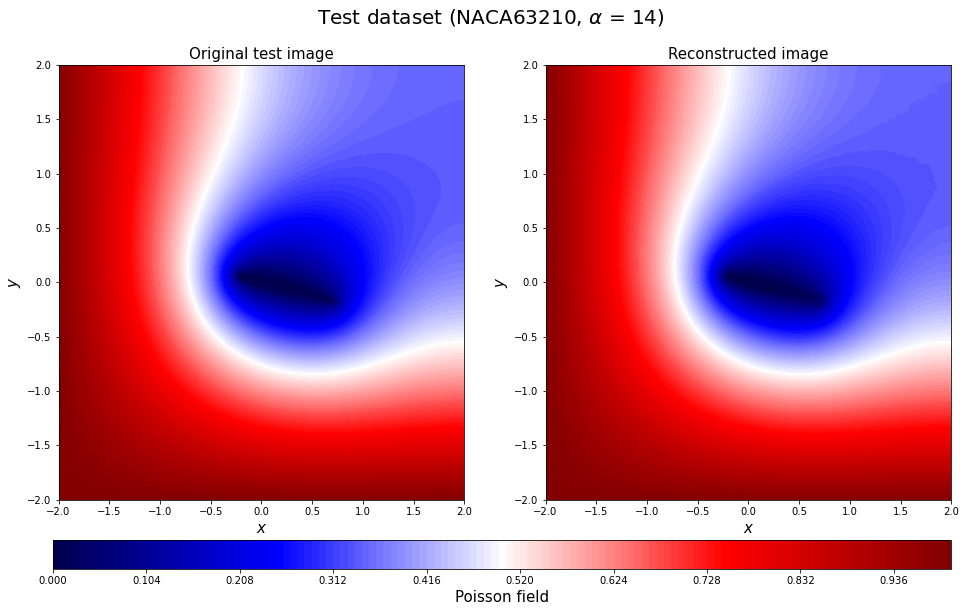

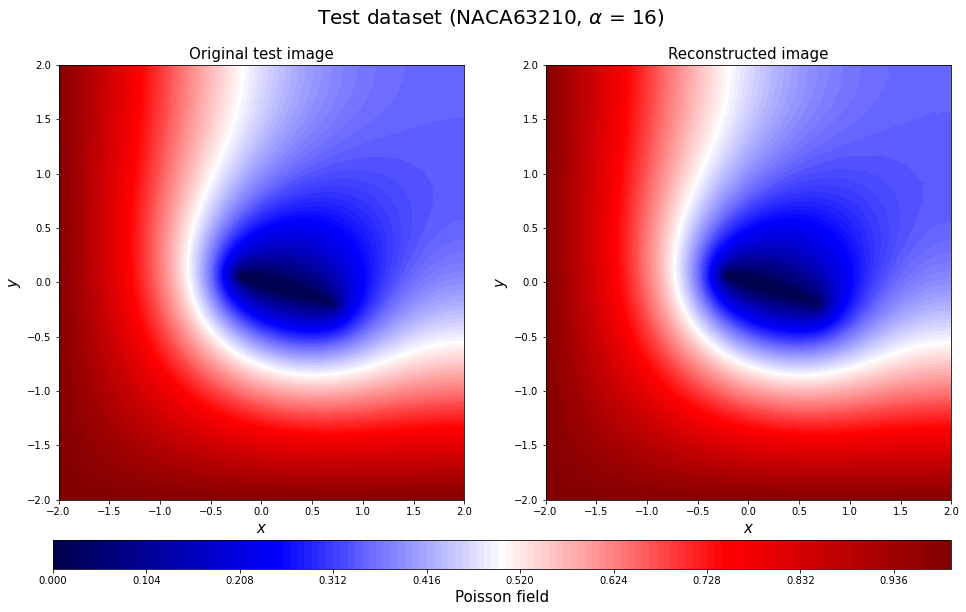

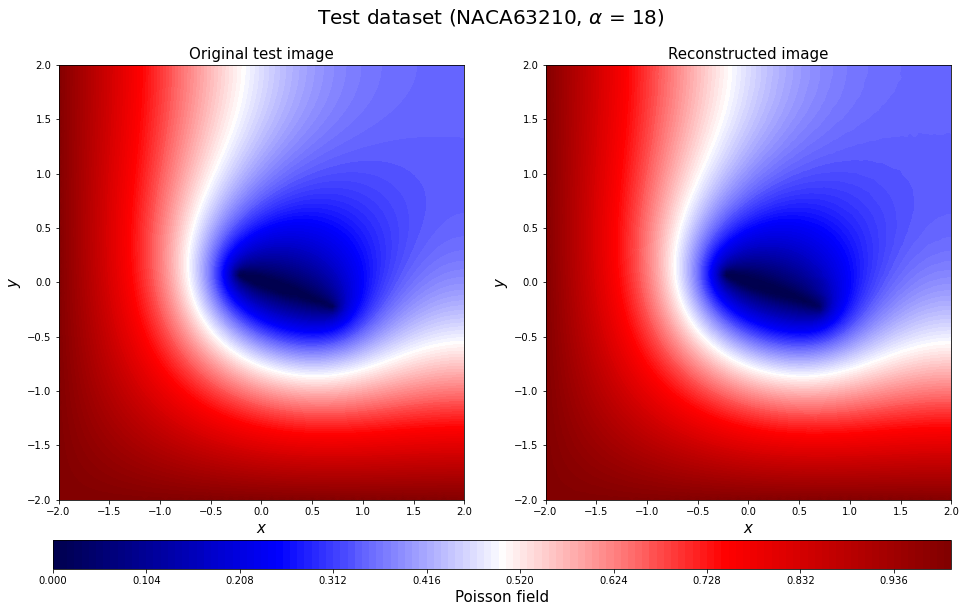

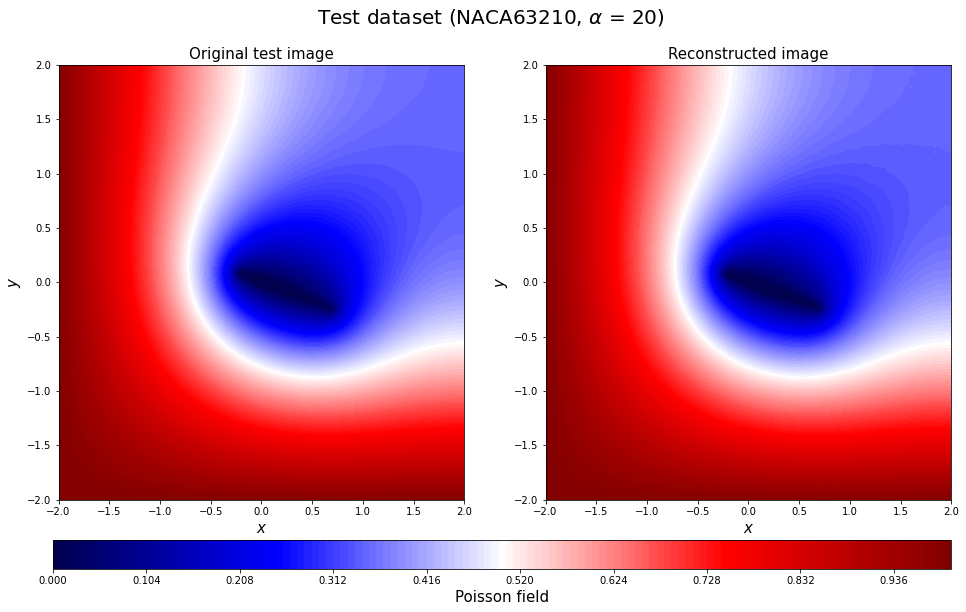

In [55]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, vmin=np.min(y_test2_rotate), 
                      vmax=np.max(y_test2_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test2_rotate), 
                      vmax=np.max(y_test2_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

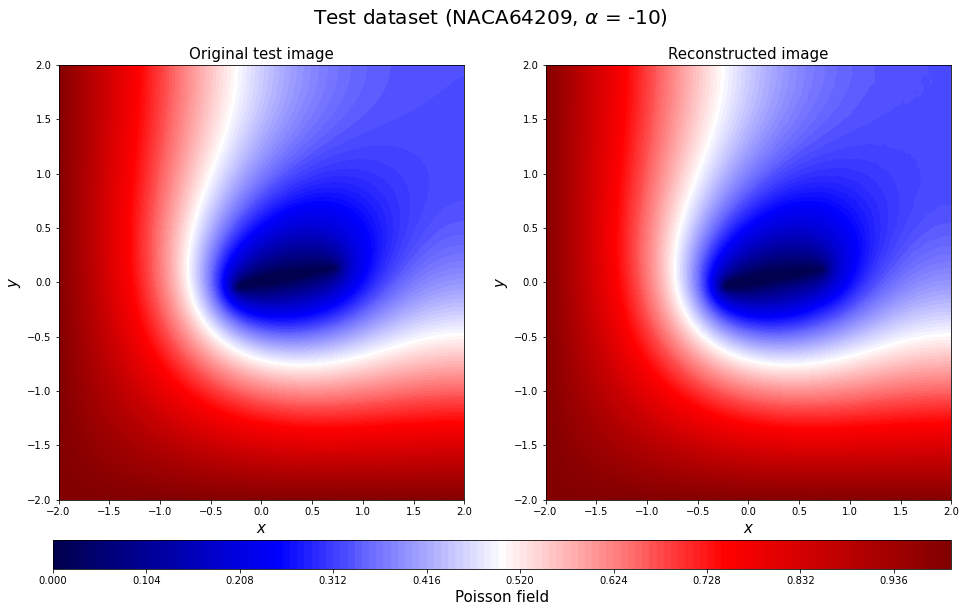

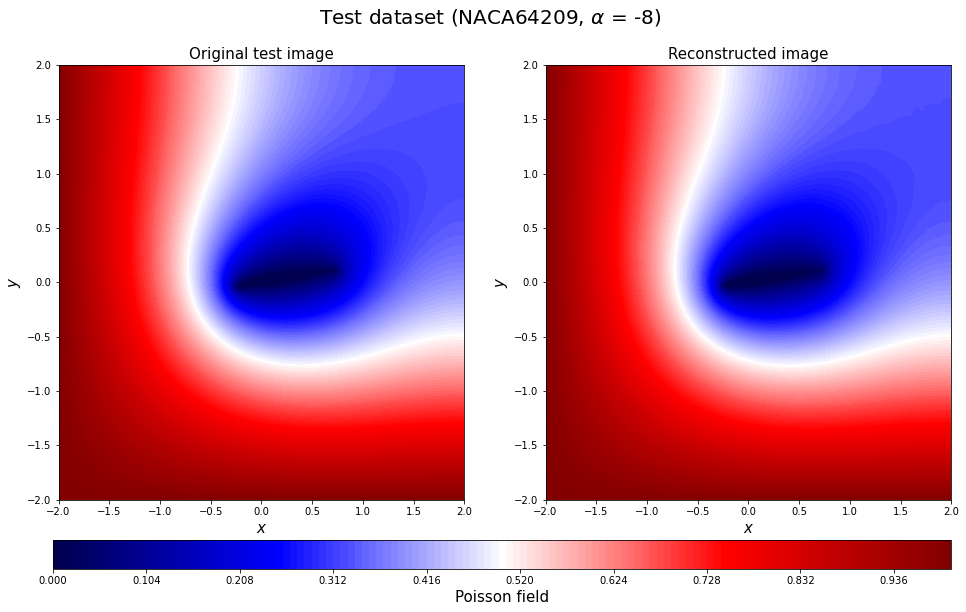

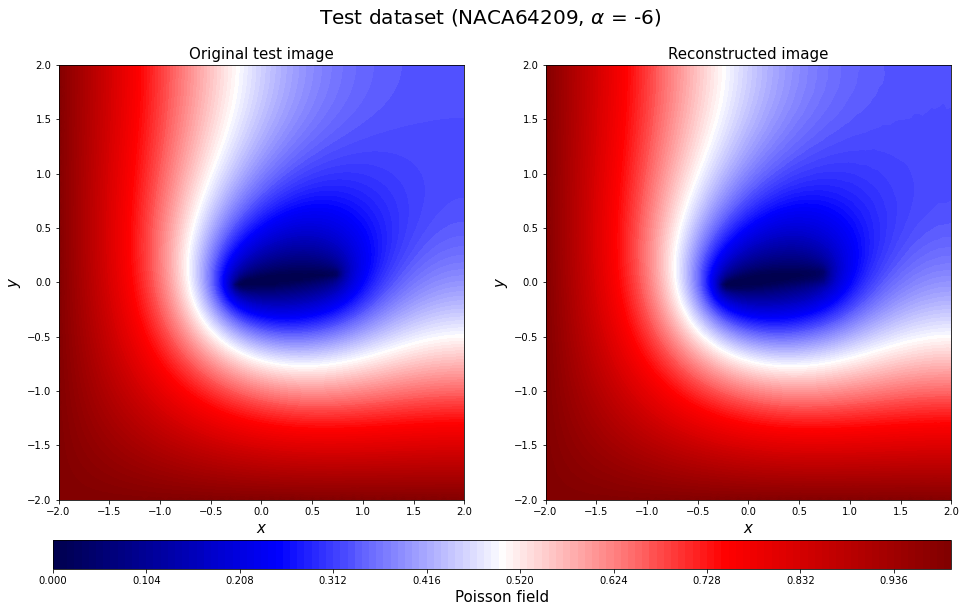

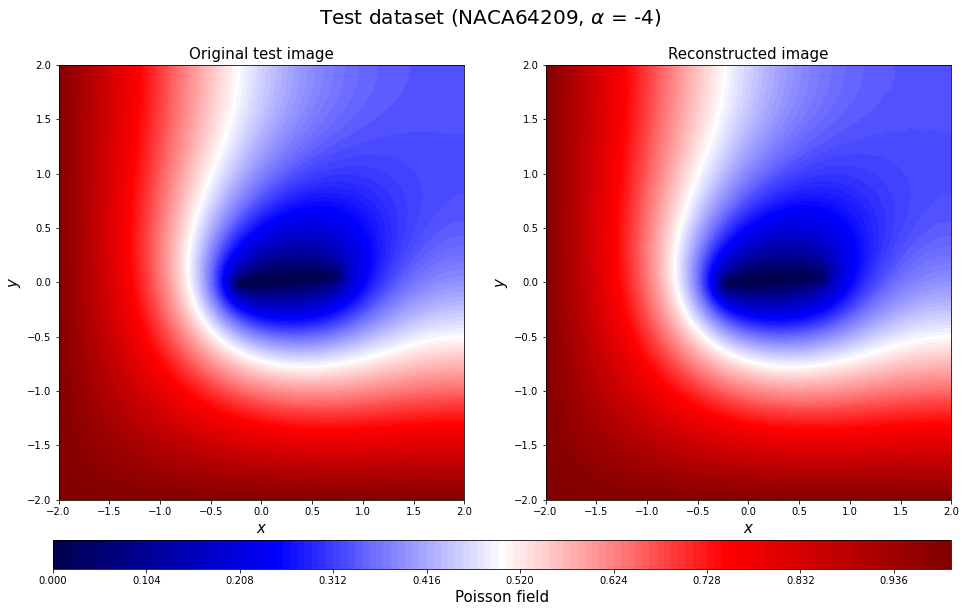

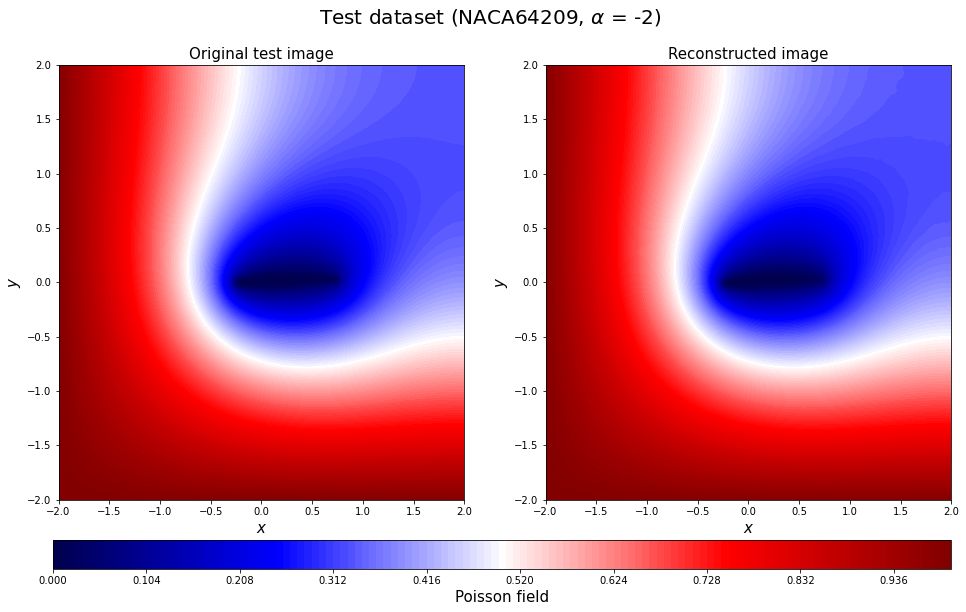

...

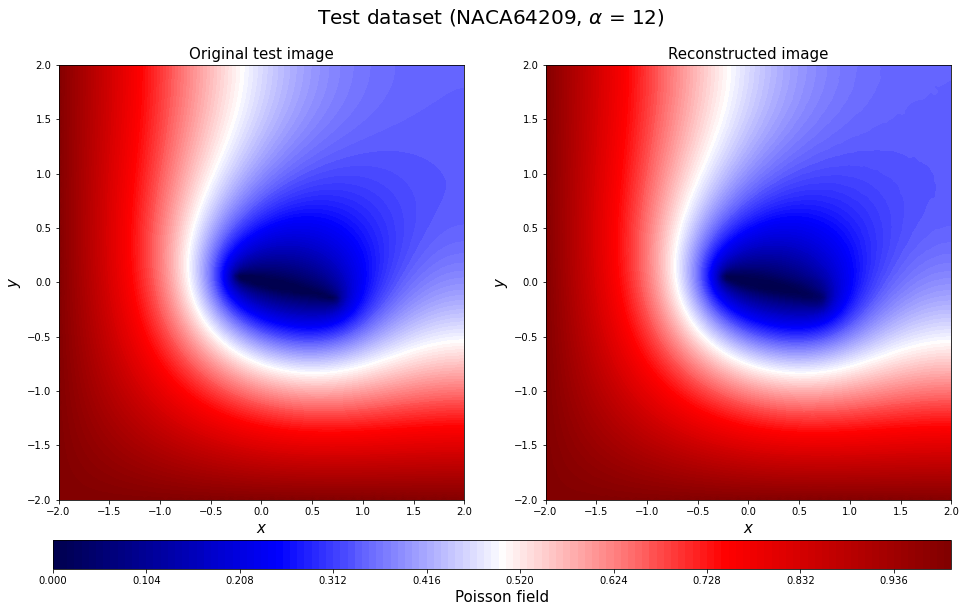

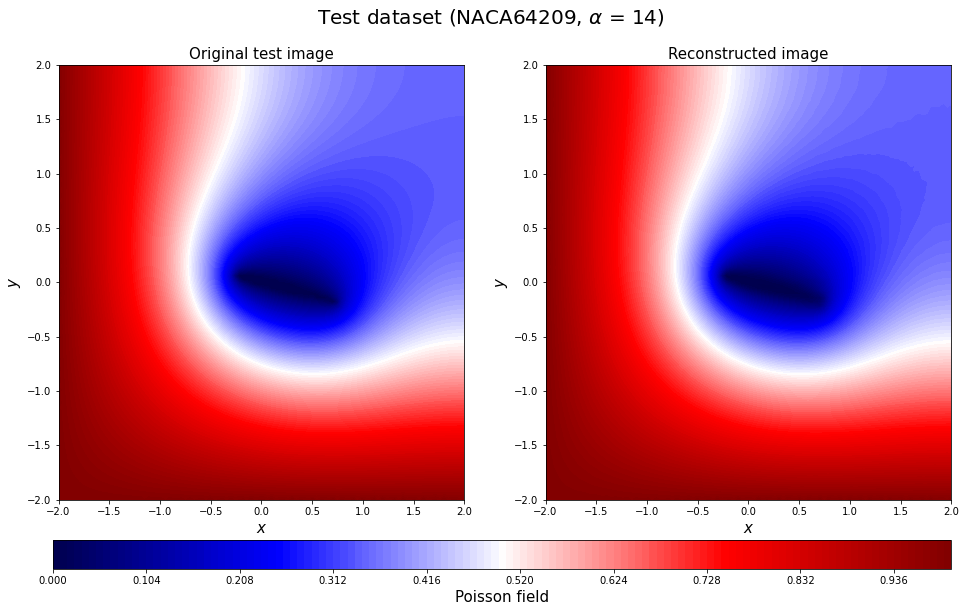

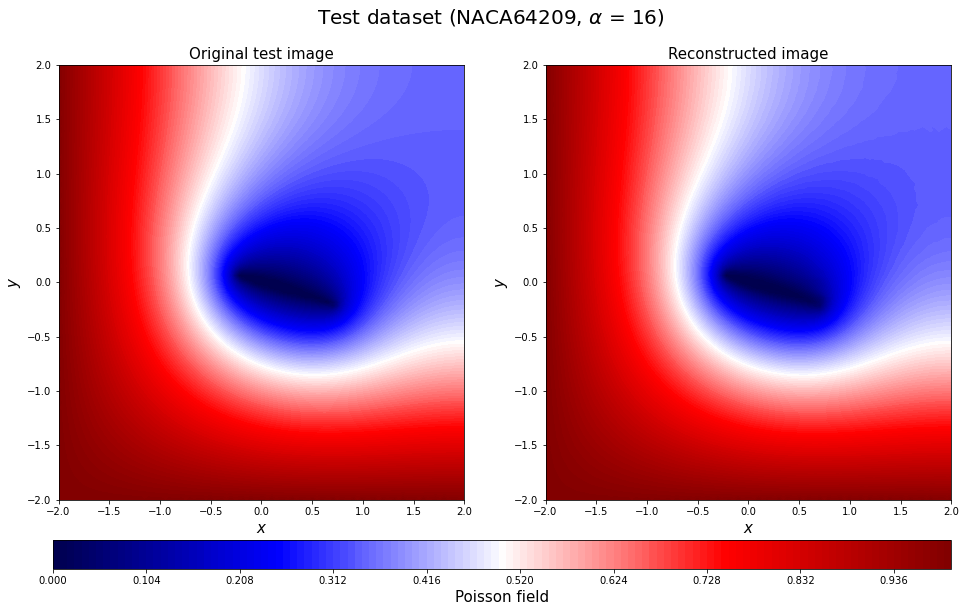

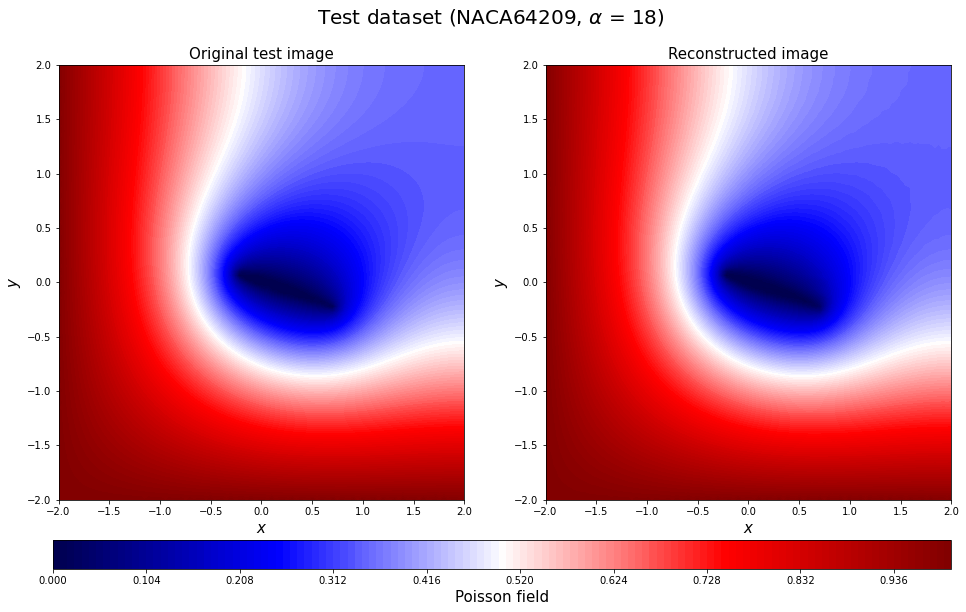

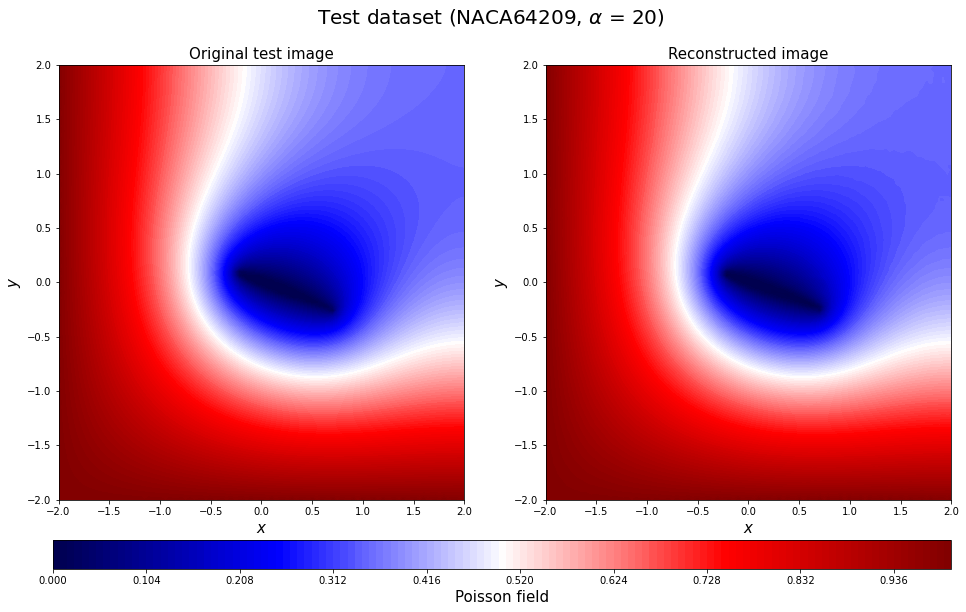

In [56]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                      vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                      vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

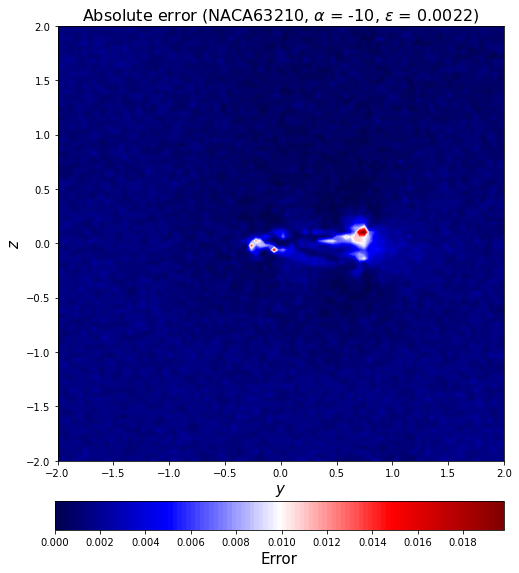

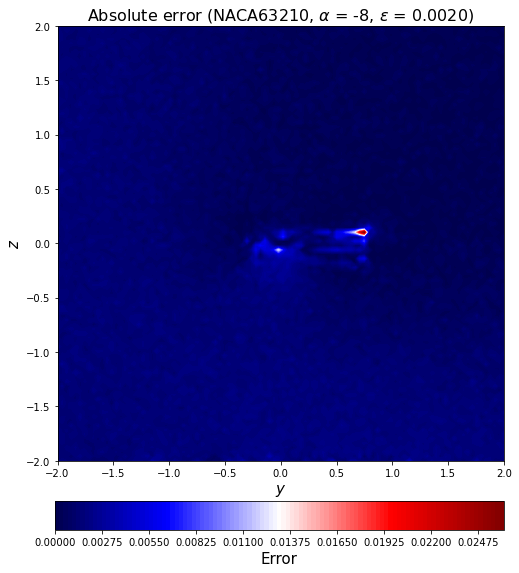

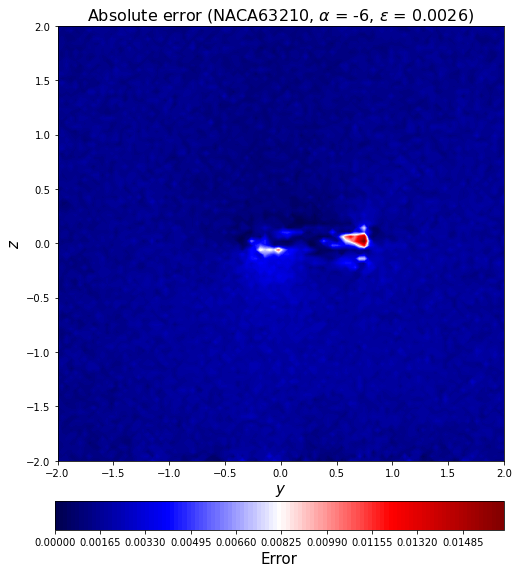

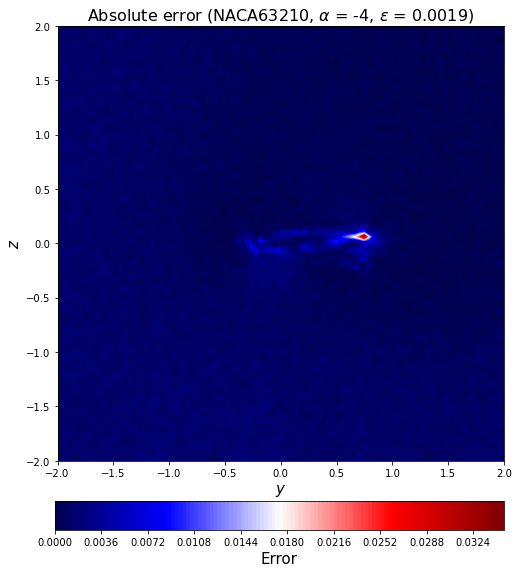

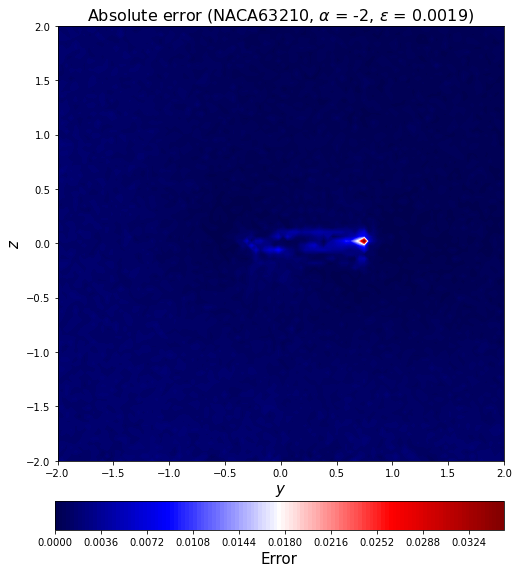

...

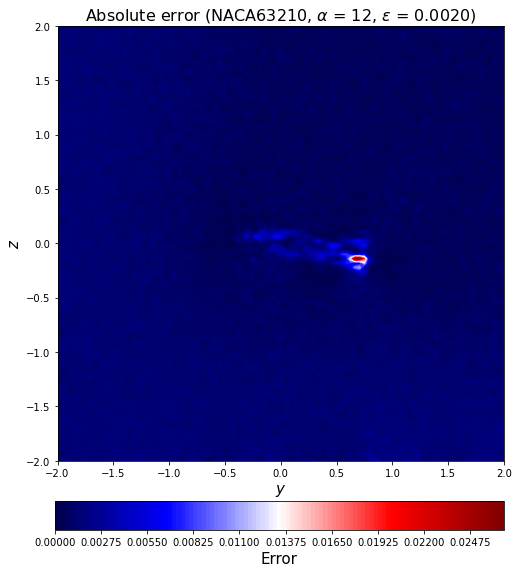

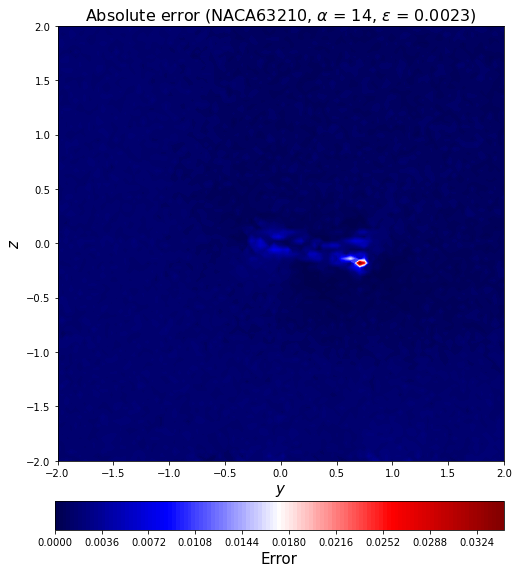

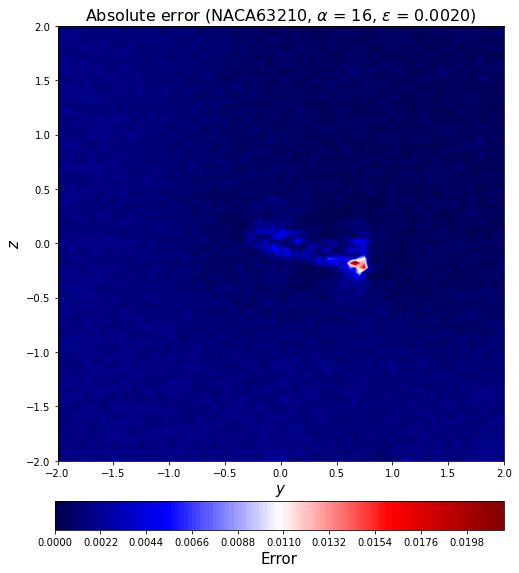

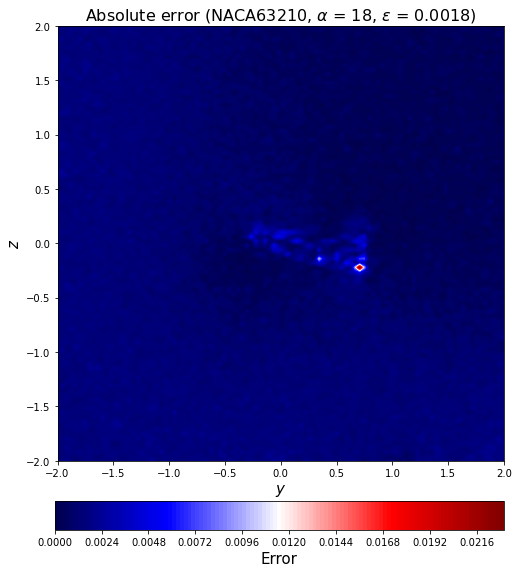

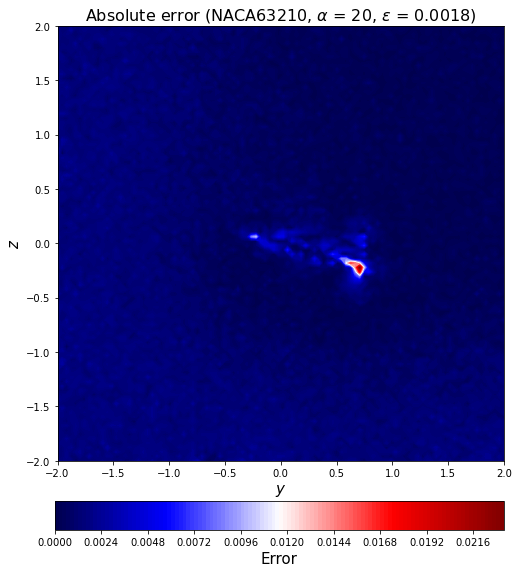

In [57]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

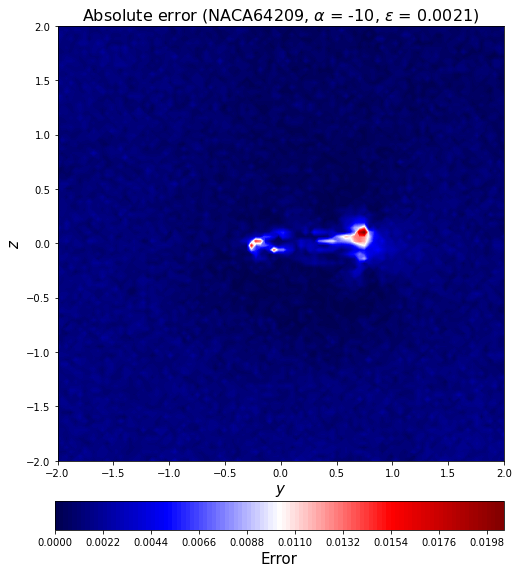

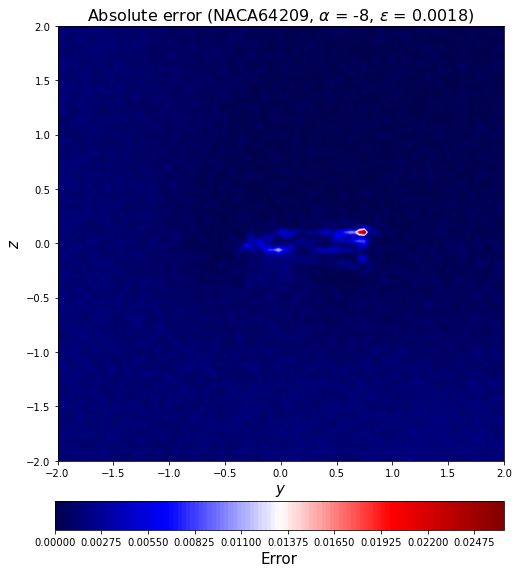

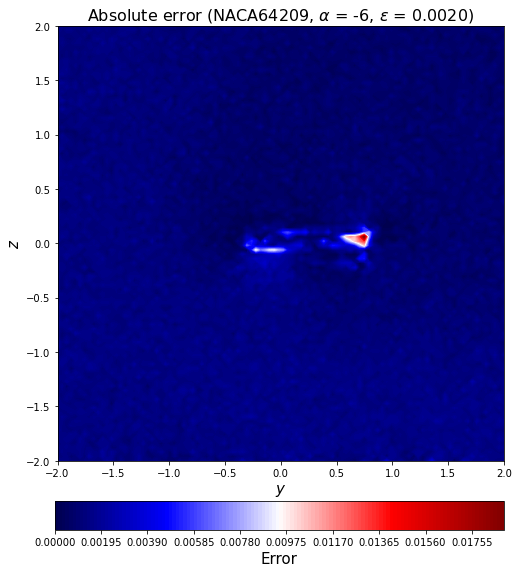

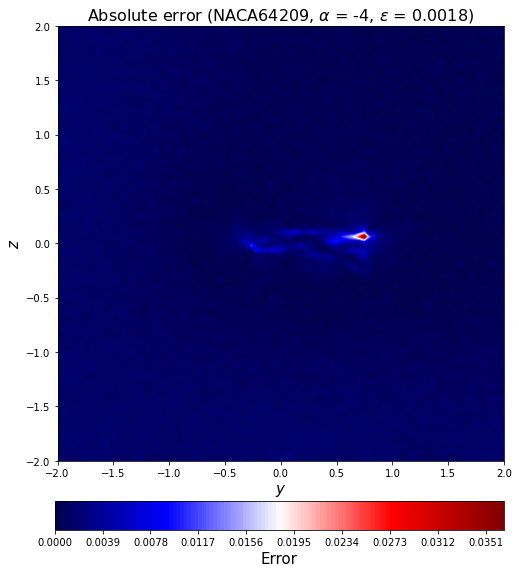

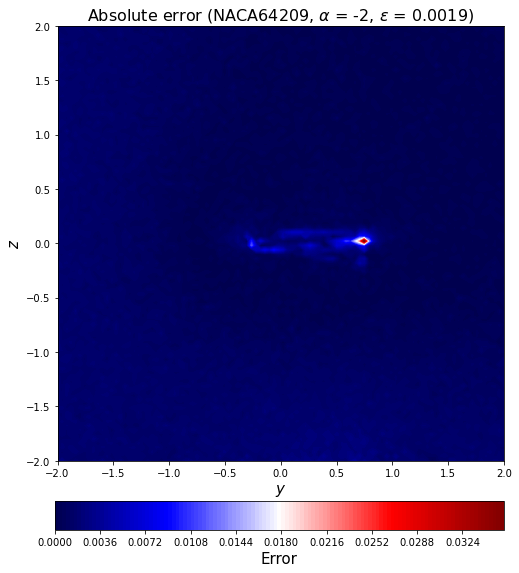

...

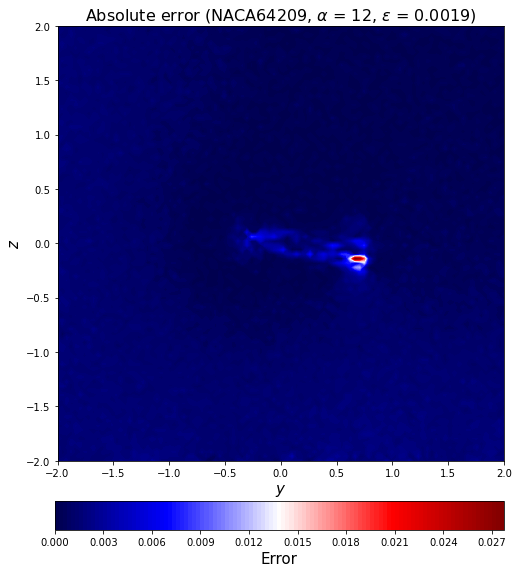

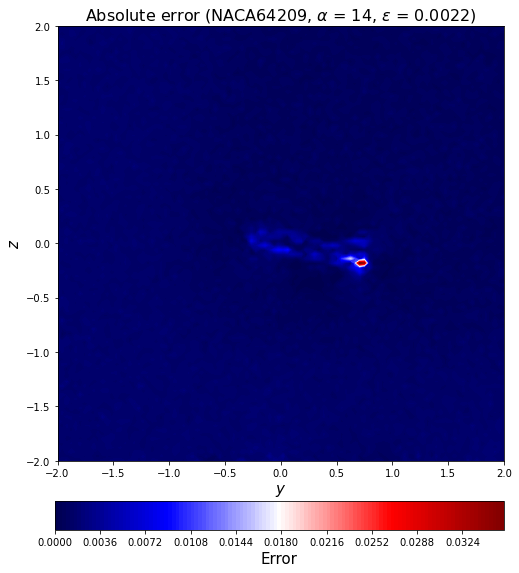

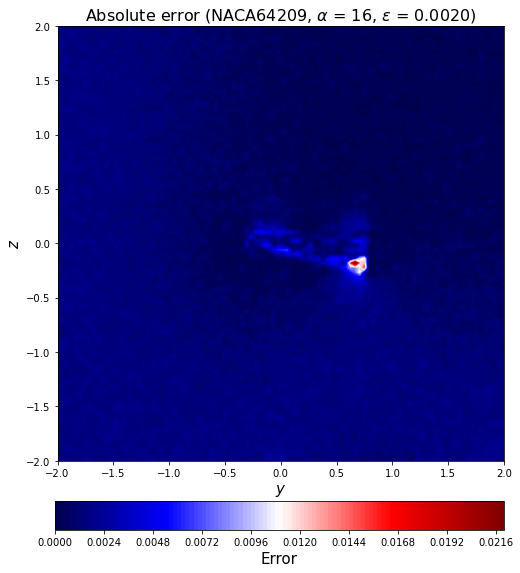

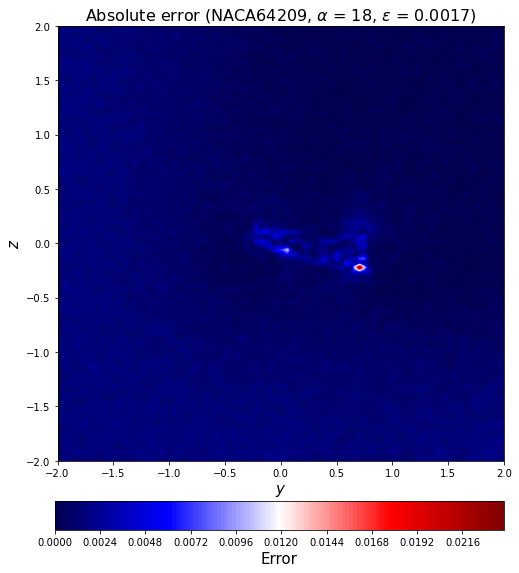

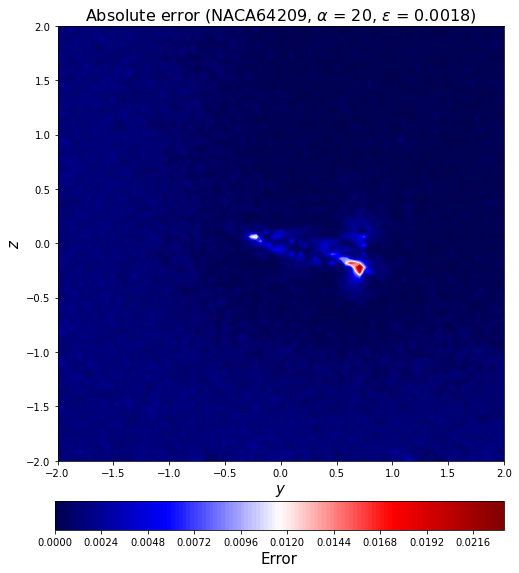

In [58]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [59]:
MAPE_train = (np.sum(np.abs(np.sum(y_train)-np.sum(decoded_train))) / np.abs(np.sum(y_train)))/(y_train.shape[0]/16)*100
acc_train = 1-MAPE_train

In [60]:
MAPE_val = (np.sum(np.abs(np.sum(y_val)-np.sum(decoded_val))) / np.abs(np.sum(y_val)))/(y_val.shape[0]/16)*100
acc_val = 1-MAPE_val

In [61]:
MAPE_test = (np.sum(np.abs(np.sum(y_test)-np.sum(decoded_test))) / np.abs(np.sum(y_test)))/(y_test.shape[0]/16)*100
acc_test = 1-MAPE_test

In [62]:
print(MAPE_train)
print(acc_train)

0.001364012217259502
0.9986359877827405


In [63]:
print(MAPE_val)
print(acc_val)

0.006847780412957604
0.9931522195870424


In [64]:
print(MAPE_test)
print(acc_test)

0.006834476013605538
0.9931655239863945


In [65]:
MAPE_train_list = []
acc_train_list = []
for i in range(0, len(aa_train)):
    MAPE_train_data = (np.sum(np.abs(y_train[i]-decoded_train[i])) / np.sum(np.abs(y_train[i])))/(y_train.shape[0]/16)*100
    MAPE_train_list.append(MAPE_train_data)
    acc_train_data = 1 - MAPE_train_data
    acc_train_list.append(acc_train_data)

In [66]:
MAPE_val_list = []
acc_val_list = []
for i in range(0, len(aa_val)):
    MAPE_val_data = (np.sum(np.abs(y_val[i]-decoded_val[i])) / np.sum(np.abs(y_val[i])))/(y_val.shape[0]/16)*100
    MAPE_val_list.append(MAPE_val_data)
    acc_val_data = 1 - MAPE_val_data
    acc_val_list.append(acc_val_data)

In [67]:
MAPE_test_list = []
acc_test_list = []
for i in range(0, len(aa_test)):
    MAPE_test_data = (np.sum(np.abs(y_test[i]-decoded_test[i])) / np.sum(np.abs(y_test[i])))/(y_test.shape[0]/16)*100
    MAPE_test_list.append(MAPE_test_data)
    acc_test_data = 1 - MAPE_test_data
    acc_test_list.append(acc_test_data)

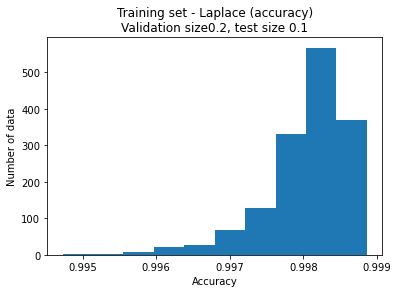

In [68]:
plt.hist(acc_train_list)
plt.title('Training set - Laplace (accuracy)\nValidation size0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
#plt.grid()
save_acc_name = "20221030Accuracy_Laplace_bc2(training).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

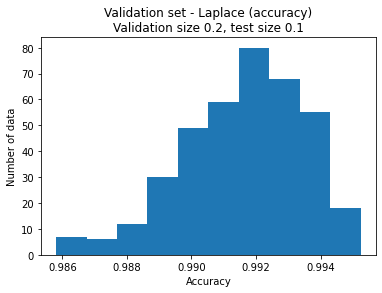

In [69]:
plt.hist(acc_val_list)
plt.title('Validation set - Laplace (accuracy)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Laplace_bc2(validation).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

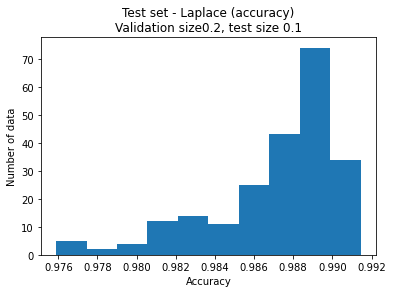

In [70]:
plt.hist(acc_test_list)
plt.title('Test set - Laplace (accuracy)\nValidation size0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Laplace_bc2(test).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

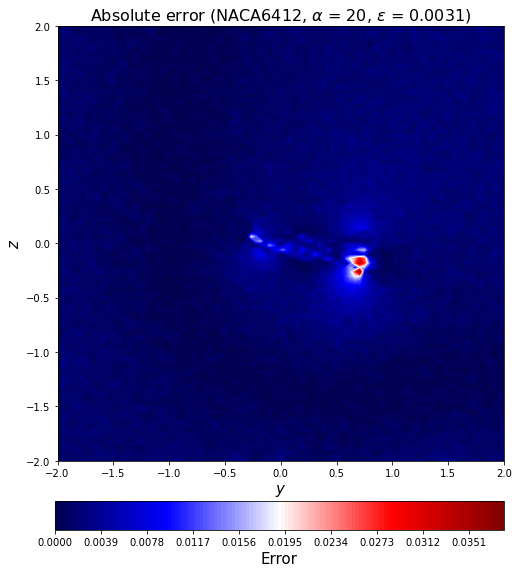

In [71]:
error_test_abs2_rotate = error_test_abs[-1].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-1])[3:-2],
                                                                   aa_test[-1], l2_error_test_list[-1]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-1])[3:-2])+str(aa_test[-1])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

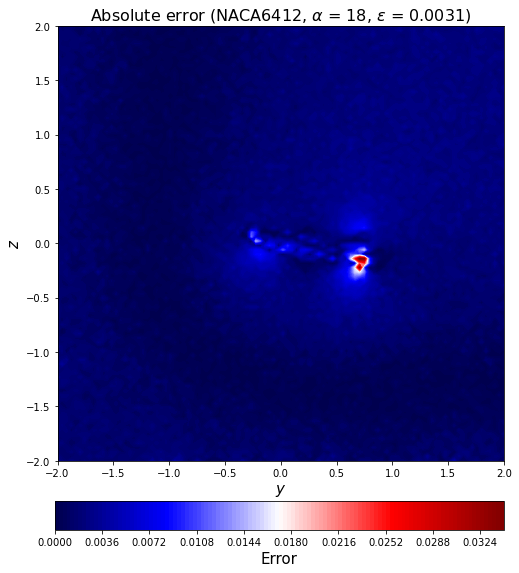

In [72]:
error_test_abs2_rotate = error_test_abs[-2].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-2])[3:-2],
                                                                   aa_test[-2], l2_error_test_list[-2]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-2])[3:-2])+str(aa_test[-2])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

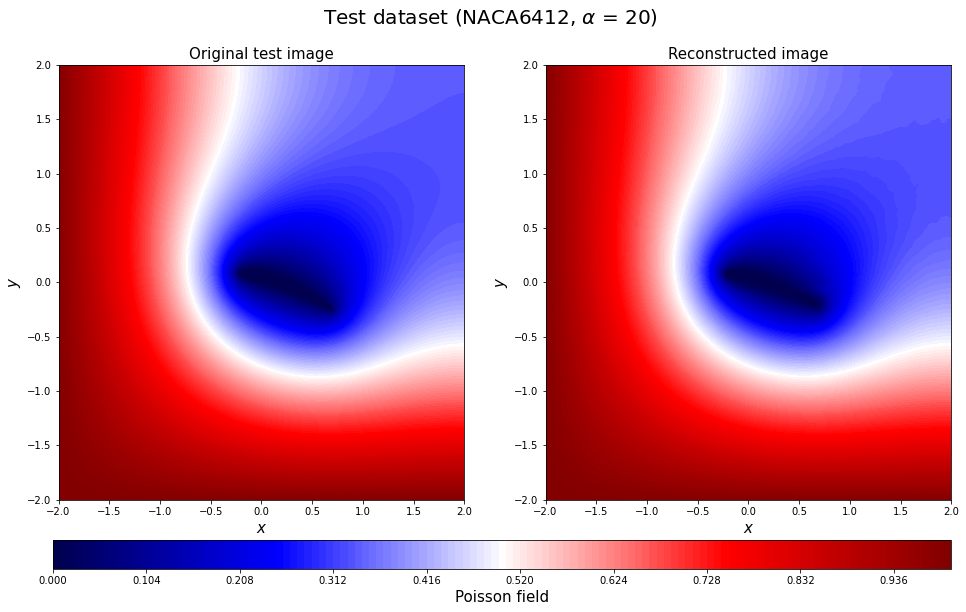

In [73]:
c=-1
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

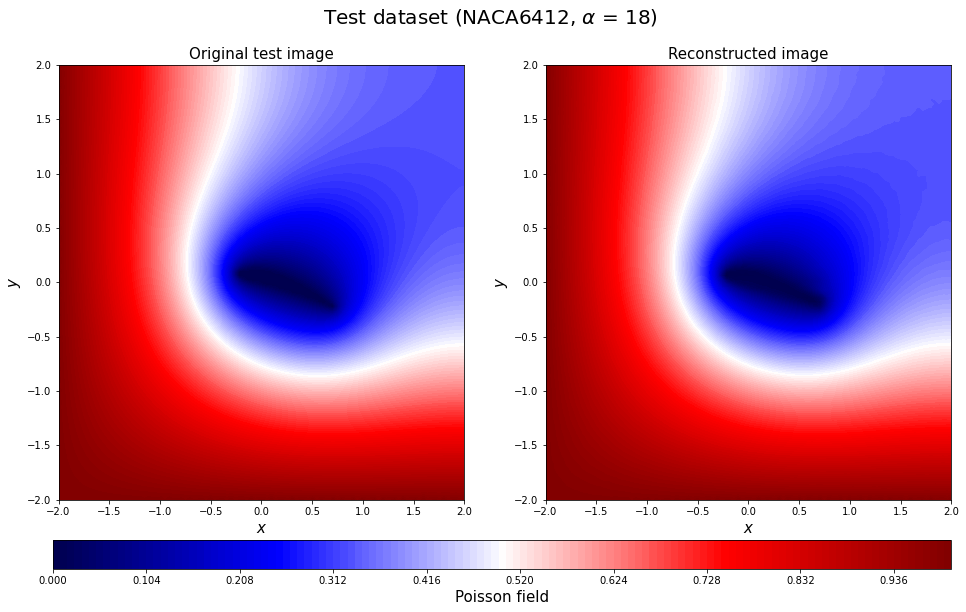

In [74]:
c=-2
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

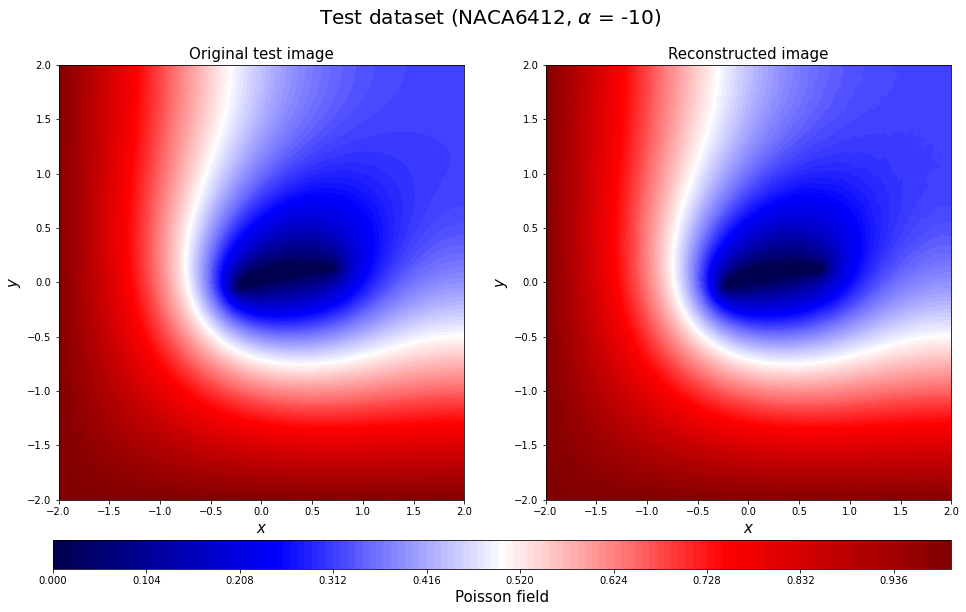

In [75]:
c=-16
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                  vmax=np.max(y_test0_rotate), levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

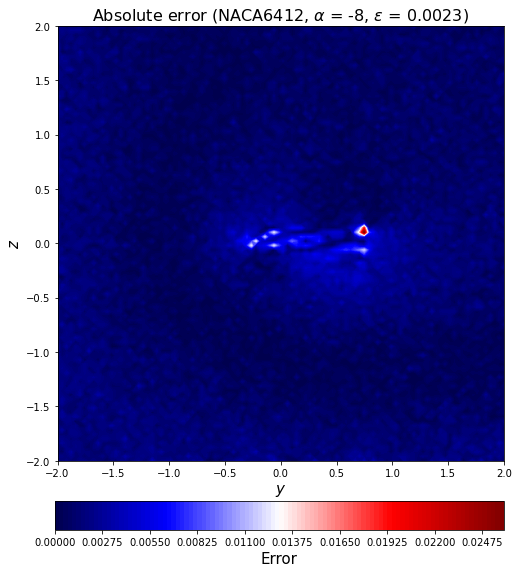

In [76]:
error_test_abs2_rotate = error_test_abs[-15].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-15])[3:-2],
                                                                   aa_test[-15], l2_error_test_list[-15]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-15])[3:-2])+str(aa_test[-15])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

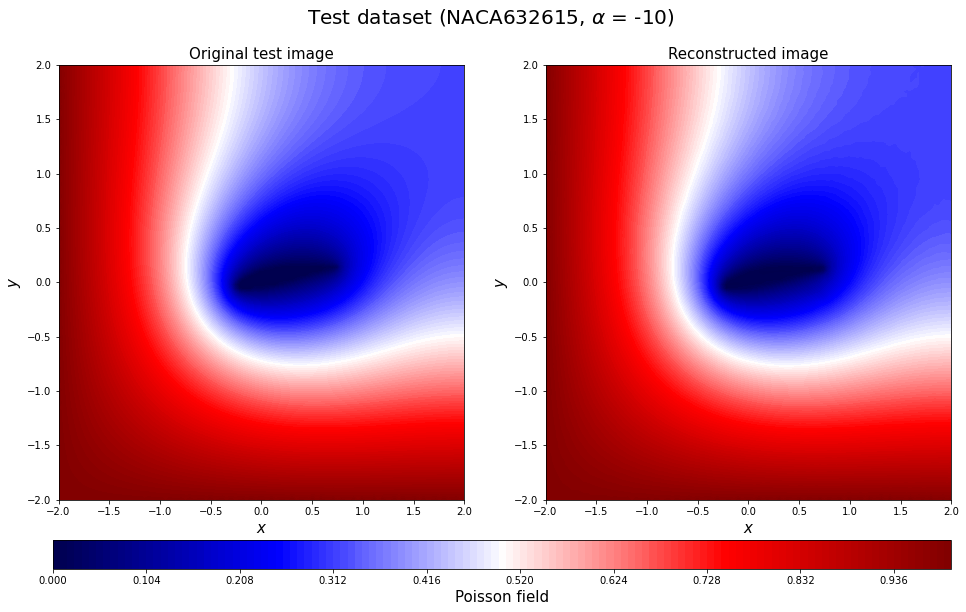

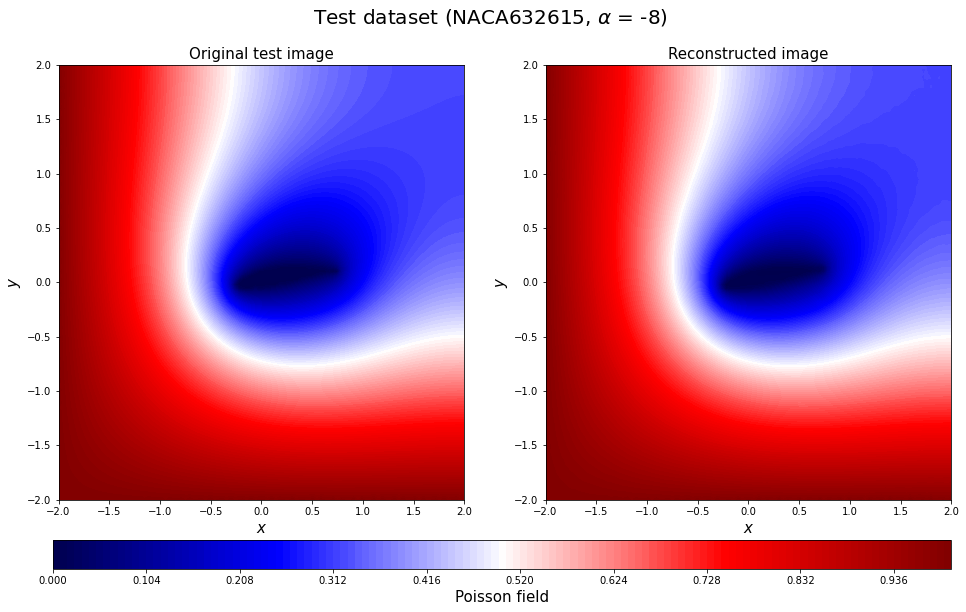

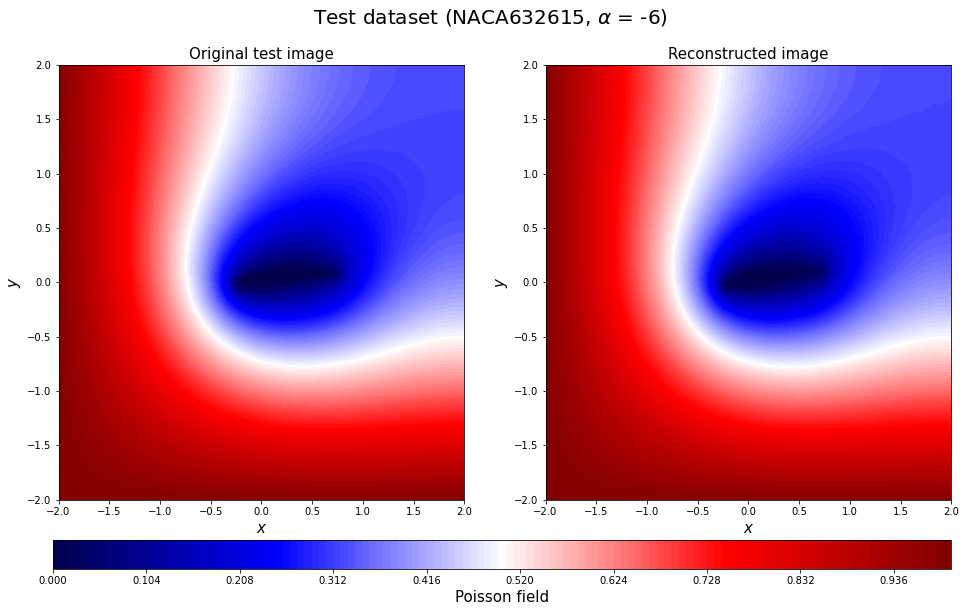

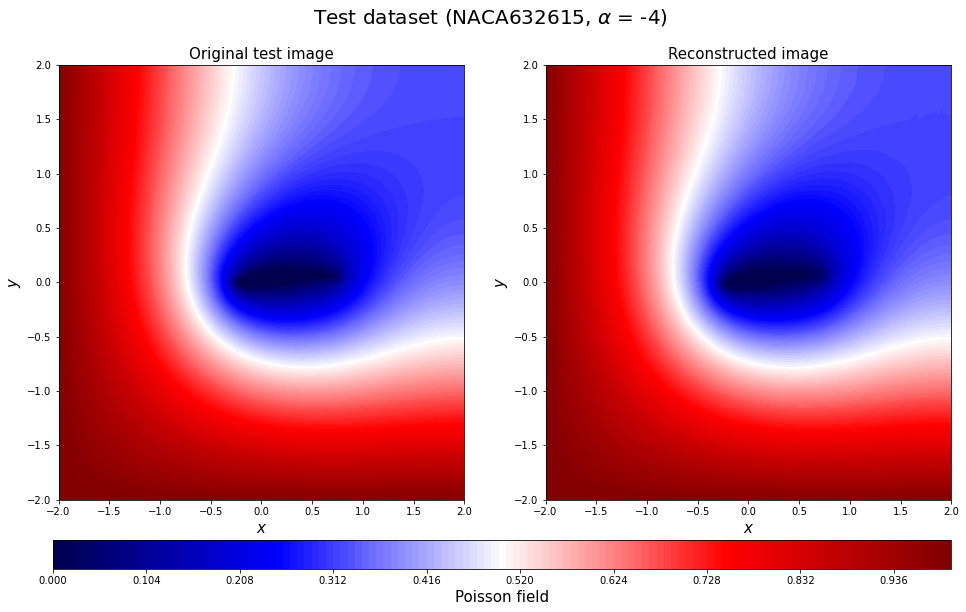

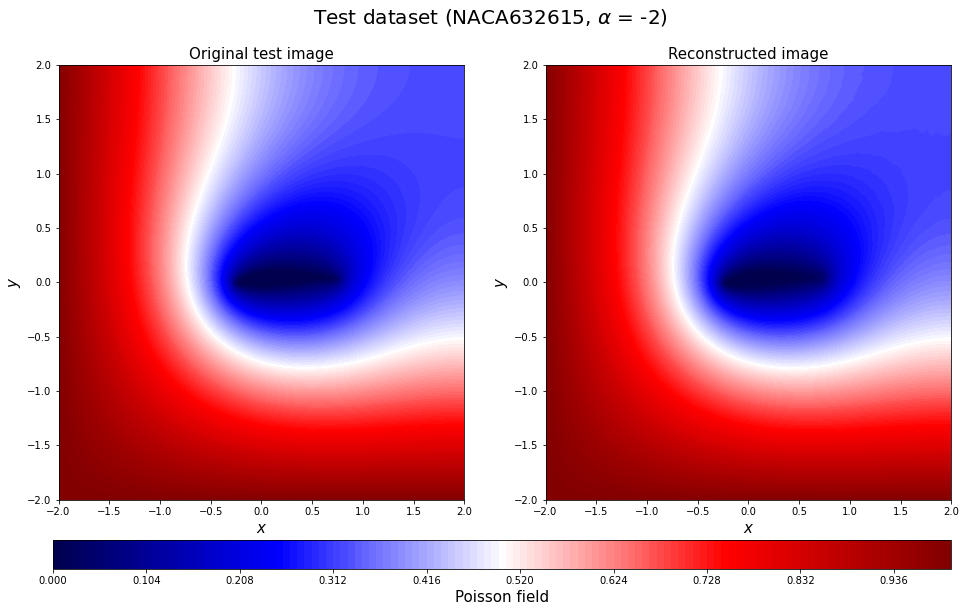

...

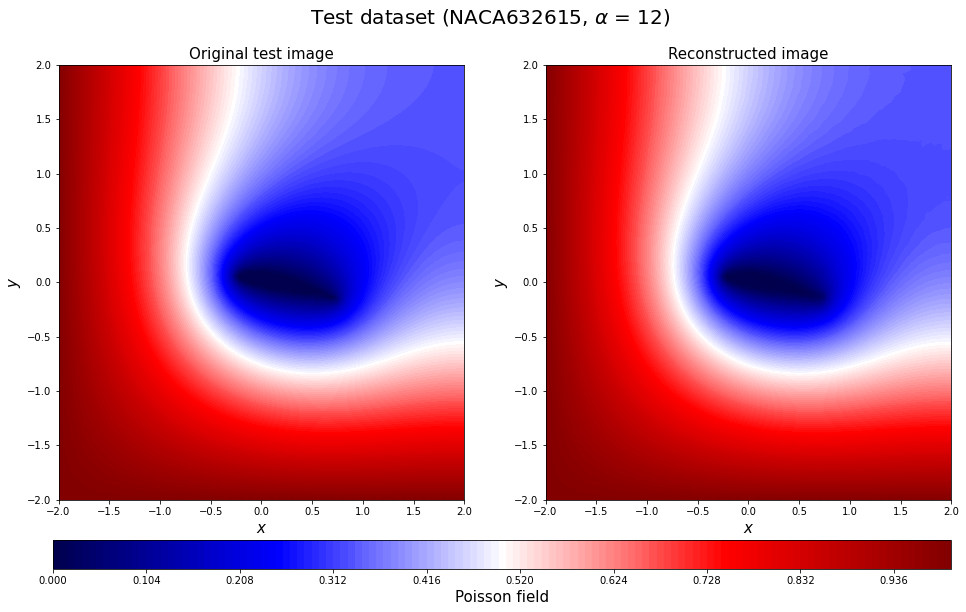

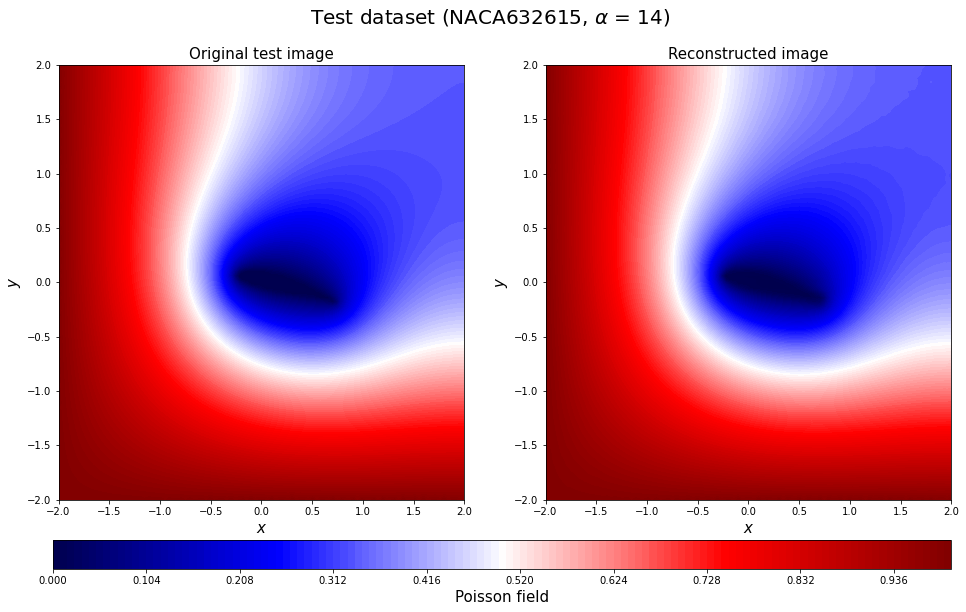

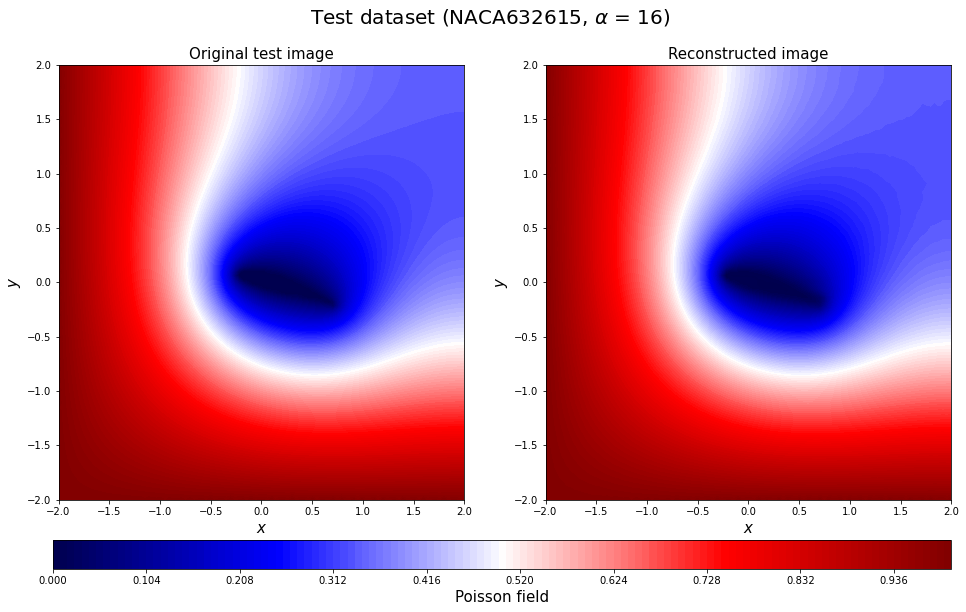

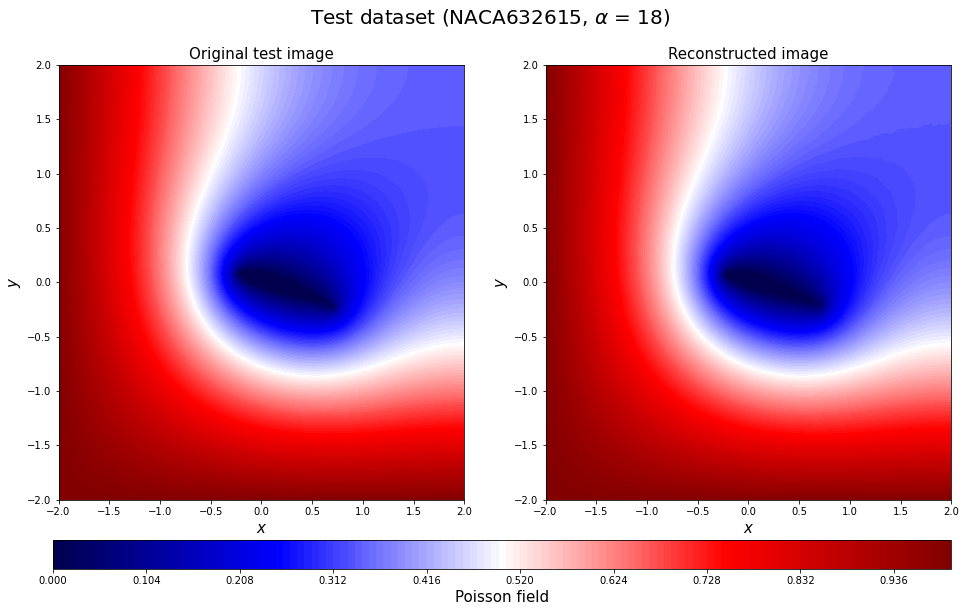

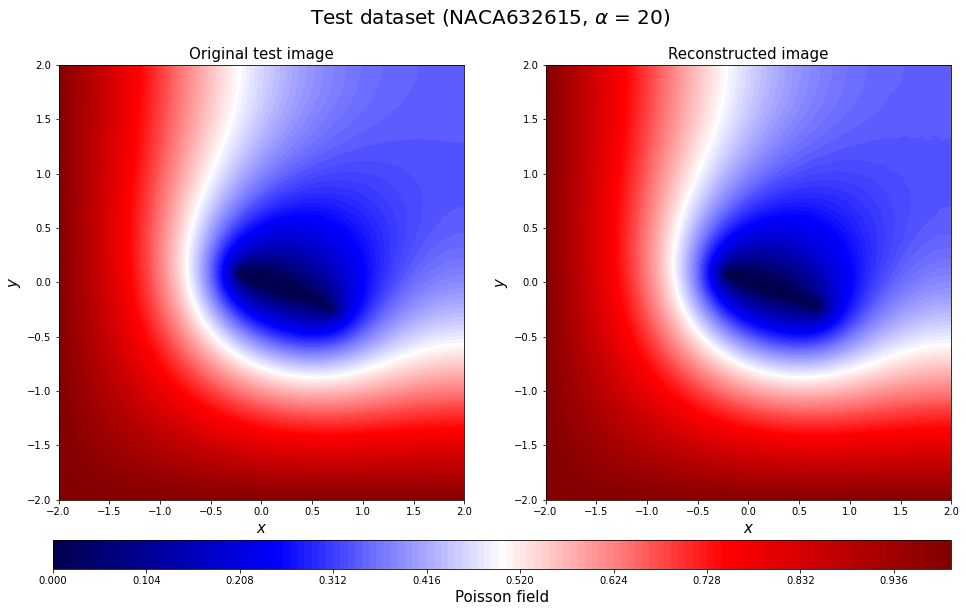

In [77]:
for c in range(96,112):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, vmin=np.min(y_test0_rotate),
                      vmax = np.max(y_test0_rotate),levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, vmin=np.min(y_test0_rotate),
                      vmax = np.max(y_test0_rotate),levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221030Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

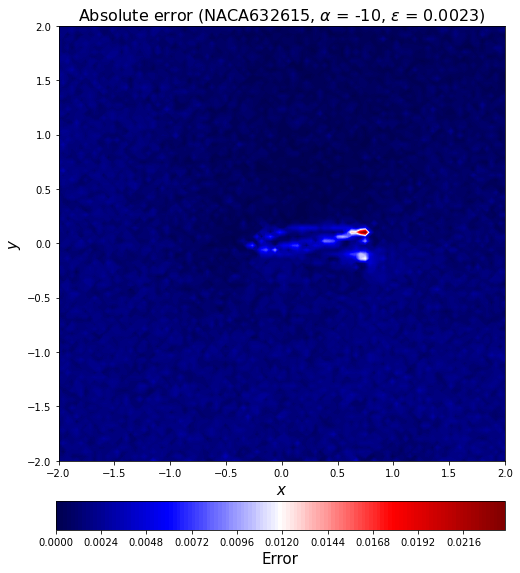

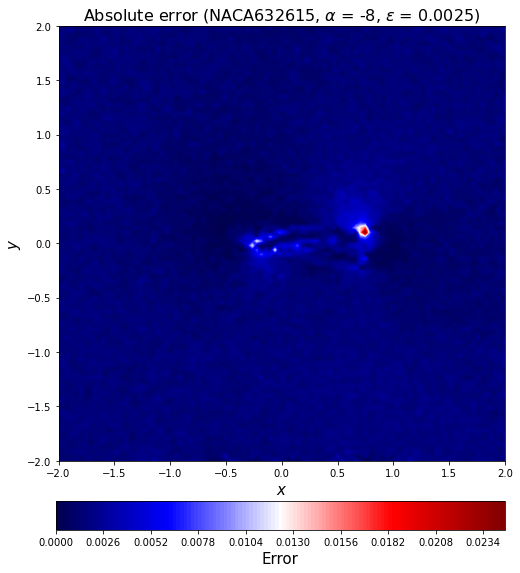

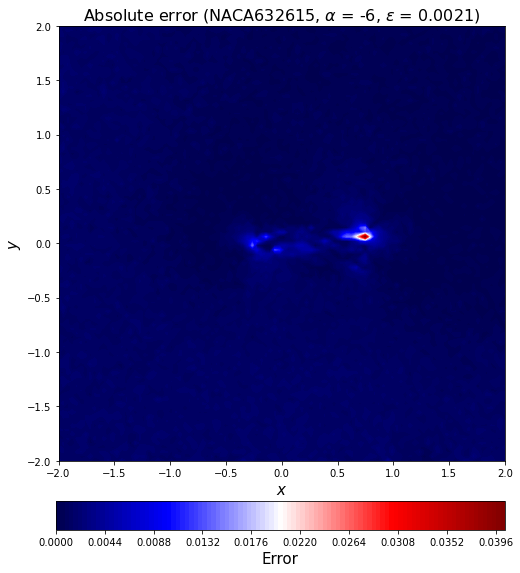

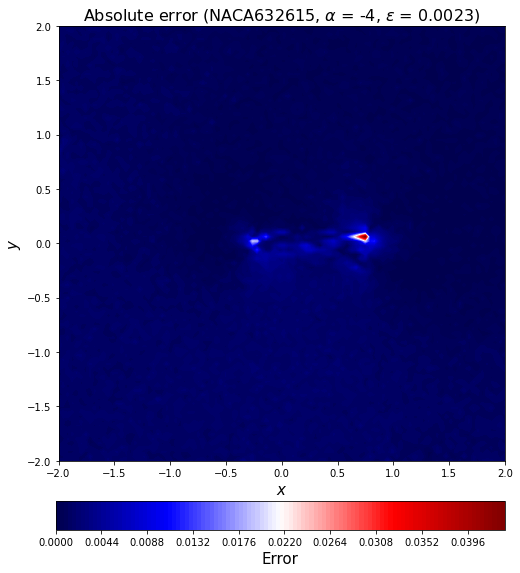

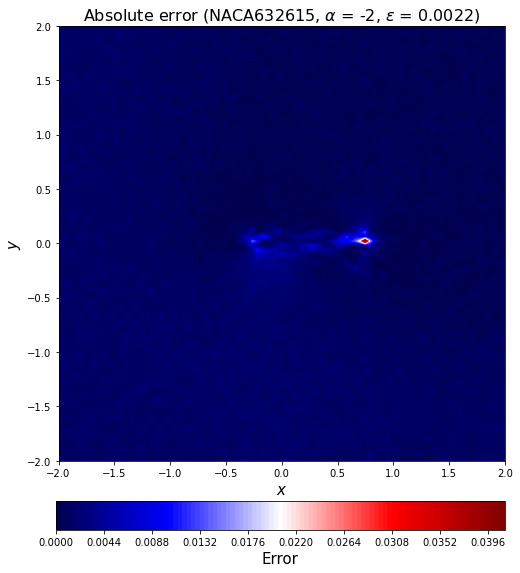

...

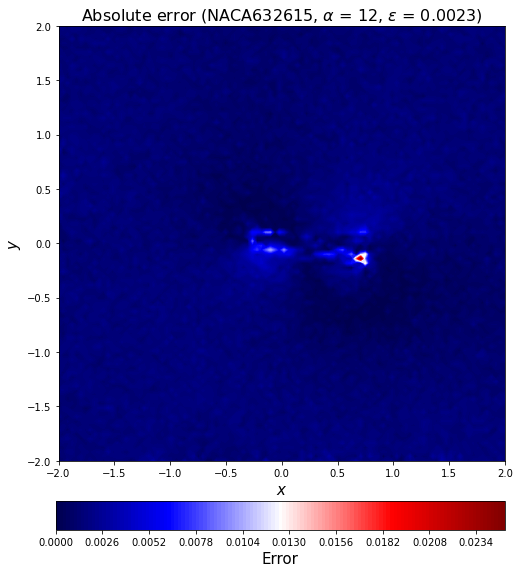

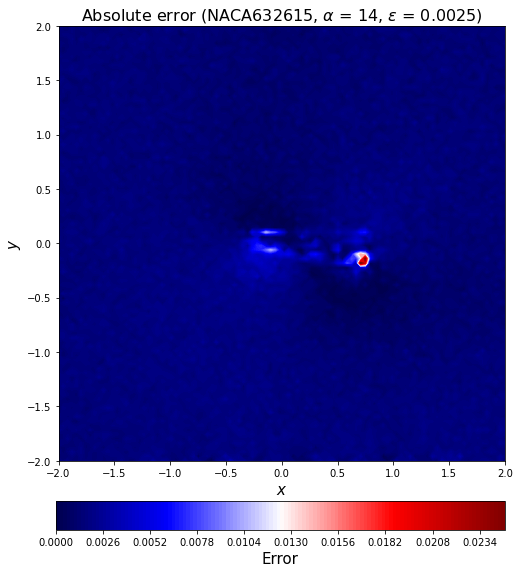

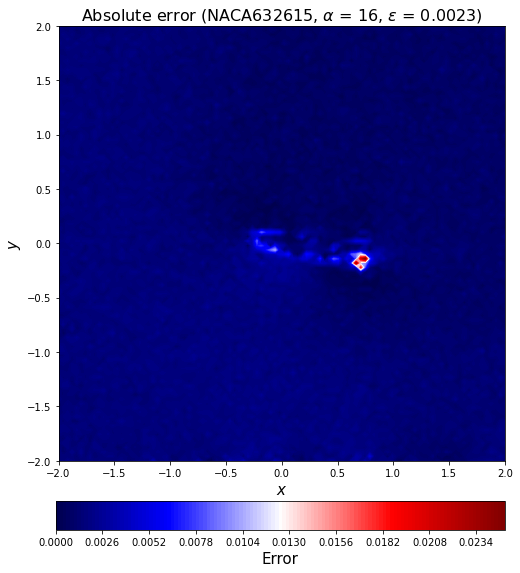

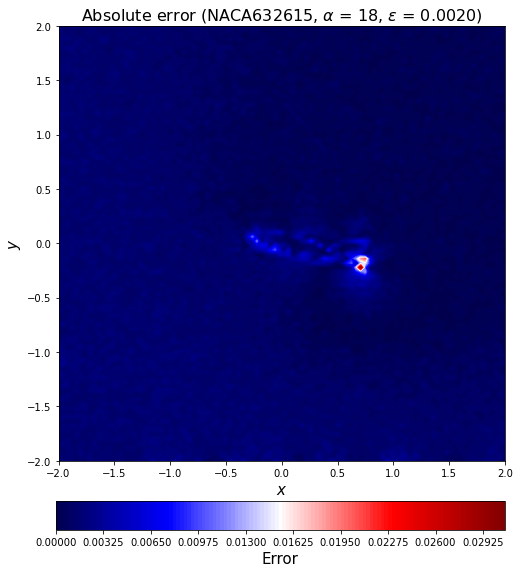

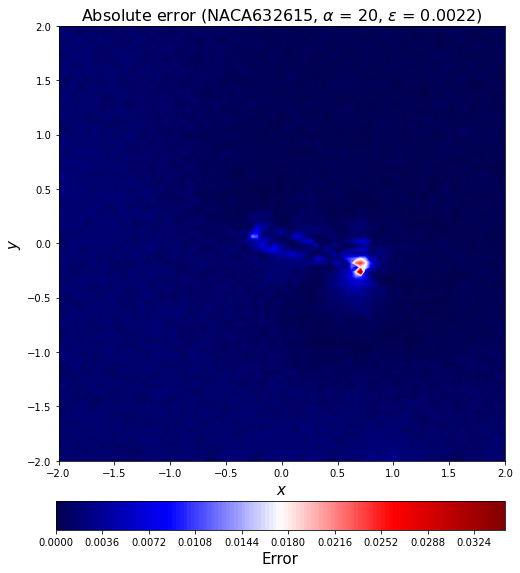

In [78]:
for c in range(96,112):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221030PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

0.99865598768769
0.0013440123123099612
0.9983117533249961
0.0016882466750038905
0.9988217511218336
0.0011782488781664213


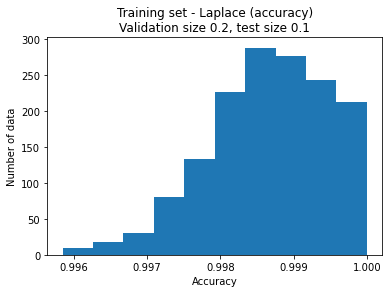

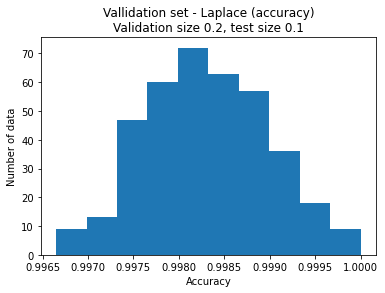

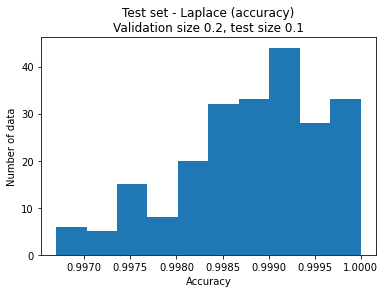

In [82]:
yTrainSum = np.zeros((y_train.shape[0],1))
dTrainSum = np.zeros((decoded_train.shape[0], 1))
MAPE_train_list = np.zeros((y_train.shape[0], 1))
for i in range(0, y_train.shape[0]):
    yTrainSum[i,:] = np.sum(y_train[i])
    dTrainSum[i,:] = np.sum(decoded_train[i])
    MAPE_train_list[i,:] = np.abs((dTrainSum[i,:]-yTrainSum[i,:])/yTrainSum[i,:])
    
MAPE_train =1-np.sum(MAPE_train_list)/x_train.shape[0]
print(MAPE_train)
acc_train = 1-MAPE_train
print(acc_train)
acc_train_list = 1 - MAPE_train_list

yValSum = np.zeros((y_val.shape[0],1))
dValSum = np.zeros((decoded_val.shape[0], 1))
MAPE_val_list = np.zeros((y_val.shape[0], 1))
for i in range(0, y_val.shape[0]):
    yValSum[i,:] = np.sum(y_val[i])
    dValSum[i,:] = np.sum(decoded_val[i])
    MAPE_val_list[i,:] = np.abs((dValSum[i,:]-yValSum[i,:])/yValSum[i,:])
    
MAPE_val = 1-np.sum(MAPE_val_list)/x_val.shape[0]
print(MAPE_val)
acc_val = 1-MAPE_val
print(acc_val)
acc_val_list = 1 - MAPE_val_list

yTestSum = np.zeros((y_test.shape[0],1))
dTestSum = np.zeros((decoded_test.shape[0], 1))
MAPE_test_list = np.zeros((y_test.shape[0], 1))
for i in range(0, y_test.shape[0]):
    yTestSum[i,:] = np.sum(y_test[i])
    dTestSum[i,:] = np.sum(decoded_test[i])
    MAPE_test_list[i,:] = np.abs((dTestSum[i,:]-yTestSum[i,:])/yTestSum[i,:])
    
MAPE_test = 1-np.sum(MAPE_test_list)/x_test.shape[0]
print(MAPE_test)
acc_test = 1-MAPE_test
print(acc_test)
acc_test_list = 1 - MAPE_test_list

plt.hist(acc_train_list)
plt.title('Training set - Laplace (accuracy)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
#plt.grid()
save_acc_name = "20221030Accuracy_Poisson_bc2(training).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

plt.hist(acc_val_list)
plt.title('Vallidation set - Laplace (accuracy)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Poisson_bc2(validation).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

plt.hist(acc_test_list)
plt.title('Test set - Laplace (accuracy)\nValidation size 0.2, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
save_acc_name = "20221030Accuracy_Poisson_bc2(test).jpg"
plt.savefig(save_acc_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()